In [2]:
#!pip install missingno

import missingno as msno
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import re
import math
import category_encoders as ce

from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
pd.set_option("display.max_columns", None)
pd.reset_option("display.max_rows", None)
pd.set_option("display.max_colwidth", None)
sns.set(style="darkgrid")

#### [source: Kaggle. House Prices.](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data "House Prices")

# Задача и цели
Данный датасет представляет собой информацию о характеристиках жилой недвижимости и результатах их продажи. Он используется для анализа и построения модели машинного обучения, которая предсказывает цену недвижимости на основе предоставленных данных.

**Задача машинного обучения**
- Целью является решение **`задачи линейной регрессии`** : $a(x) = \langle w, x \rangle + w_0$ , где $w \in \mathbb{R}^d$, $w_0 \in \mathbb{R}$. Необходимо предсказать стоимость недвижимости на основе её характеристик.

**Целевая переменная**
- `SalePrice` — цена недвижимости (в долларах), которая выступает в роли целевой переменной.



## Признаки

### Общие характеристики
- **`MSSubClass`**: Тип недвижимости (код).
- **`MSZoning`**: Тип зонирования (например, Residential Low Density, Commercial).
- **`LotFrontage`**: Длина участка, примыкающего к улице (в футах).
- **`LotArea`**: Площадь участка (в квадратных футах).

### Характеристики участка
- **`Street`**: Тип покрытия улицы (гравий, асфальт).
- **`Alley`**: Тип доступа к переулку.
- **`LotShape`**: Форма участка (регулярная, слегка/сильно неправильная).
- **`LandContour`**: Рельеф участка (плоский, на склоне и т.д.).
- **`Utilities`**: Наличие коммунальных услуг (электричество, вода, газ).
- **`LotConfig`**: Конфигурация участка (угловой, в тупике и т.д.).
- **`LandSlope`**: Уклон участка (слабый, умеренный, сильный).

### Расположение
- **`Neighborhood`**: Район в пределах города.
- **`Condition1`**, **`Condition2`**: Близость к дорогам, железным дорогам или паркам.

### Характеристики здания
- **`BldgType`**: Тип здания (например, односемейный дом, дуплекс).
- **`HouseStyle`**: Стиль дома (например, одноэтажный, двухэтажный).
- **`OverallQual`**: Качество материалов и отделки (от 1 до 10).
- **`OverallCond`**: Общее состояние дома (от 1 до 10).
- **`YearBuilt`**: Год постройки.
- **`YearRemodAdd`**: Год последнего ремонта.

### Крыша и экстерьер
- **`RoofStyle`**, **`RoofMatl`**: Тип крыши и её материалы.
- **`Exterior1st`**, **`Exterior2nd`**: Материалы внешней отделки.
- **`MasVnrType`**, **`MasVnrArea`**: Тип и площадь внешней облицовки.

### Подвал
- **`BsmtQual`**, **`BsmtCond`**: Качество и состояние подвала.
- **`BsmtExposure`**: Наличие окон и выходов из подвала.
- **`BsmtFinType1`**, **`BsmtFinSF1`**: Тип и площадь отделанных помещений в подвале.
- **`BsmtUnfSF`**, **`TotalBsmtSF`**: Площадь необработанных и общая площадь подвала.

### Этажи и комнаты
- **`1stFlrSF`**, **`2ndFlrSF`**: Площадь первого и второго этажей.
- **`GrLivArea`**: Общая жилая площадь.
- **`TotRmsAbvGrd`**: Общее количество комнат.

### Кухня и ванные комнаты
- **`KitchenQual`**: Качество кухни.
- **`FullBath`**, **`HalfBath`**: Количество полных и половинных ванных комнат.

### Прочее
- **`Fireplaces`**, **`FireplaceQu`**: Количество каминов и их качество.
- **`GarageType`**, **`GarageArea`**: Тип и площадь гаража.
- **`PavedDrive`**: Наличие асфальтированной подъездной дороги.
- **`PoolArea`**, **`PoolQC`**: Площадь и качество бассейна.

# Полная информация о признаках

In [6]:
with open("data_description.txt", 'r', encoding='utf-8') as file:
    content = file.read()
print(content)

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM

# Загрузим датасет

In [8]:
df_house_prices = pd.read_csv("./house_prices.csv", index_col=0)
df = df_house_prices.iloc[:1460]
df_test = df_house_prices.iloc[1460:]
target = df["SalePrice"]
df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [9]:
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,NaN
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,NaN
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,NaN
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal,NaN
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal,NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallCond  

- *Некоторые признаки могут задаваться целочисленными хешами или id, как в нашем случае, однако, нельзя сложить двух пользователей и получить третьего, исходя из их id. Такие поля только могут способствовать переобучению. Удалим это поле из данных.*

In [12]:
#удаляем столбец Id
df = df.drop(columns=["Id"]).rename({"YrSold":"YearSold"}, axis= 1)
df_test = df_test.drop(columns=["Id"]).rename({"YrSold":"YearSold"}, axis= 1)

- *Переводим столбцы, где содержатся года, в формат datetime*

In [14]:
df.update(df.filter(like='Year').apply(pd.to_datetime, format='%Y'))

- *Выделим в разные группы количественные и категориальные признаки*

In [16]:
date_data = list(df.select_dtypes("datetime").columns)
num_data = list(df.select_dtypes([np.number]).columns)
cat_data = list(df.select_dtypes("object").columns)

## *Выясним, какие признаки содержат пропущенные значения и сколько*

In [18]:
pd.DataFrame(data = [df.isna().sum()/df.shape[0]*100, df_test.isna().sum()/df_test.shape[0]*100], index=["Train Null (%)", "Test Null (%)"]).T.style.background_gradient(cmap='viridis')

,Train Null (%),Test Null (%)
MSSubClass,0.000000,0.000000
MSZoning,0.000000,0.274160
LotFrontage,17.739726,15.558602
LotArea,0.000000,0.000000
Street,0.000000,0.000000
Alley,93.767123,92.666210
LotShape,0.000000,0.000000
LandContour,0.000000,0.000000
Utilities,0.000000,0.137080
LotConfig,0.000000,0.000000


### Признаки с большим количеством пропусков:

- Признаки, такие как `Alley`, `PoolQC`, `Fence`, `MiscFeature`, имеют более 80% пропусков. Будем исключать из анализа, либо заменим пропуски значением, отражающим их отсутствие.
  
### Признаки с умеренным количеством пропусков:

- `MasVnrType` и `FireplaceQu` содержат около 50–60% пропусков.
  
### Признаки с незначительными пропусками:

- Признаки с пропусками менее 5% (например, `LotFrontage`, `BsmtQual`, `BsmtCond`), скорее всего, будем обработать заполнением среднего или медианного значения, если их пропуски не связаны с важными категориями.

In [20]:
printmd(f"""### *Общая информация об обучающем датасете*:
- Количество строк: **{df.shape[0]}**. Количество столбцов: **{df.shape[1]}**
- В датасете **{df.duplicated().sum()}** дублей

### *Общая информация о тестовом датасете*:
- Количество строк: **{df_test.shape[0]}**. Количество столбцов: **{df_test.shape[1]}**
- В датасете **{df_test.duplicated().sum()}** дублей

### *Информация о переменных*:
- Количественные переменные ({len(num_data)}):\n
**{num_data}**
- Категориальные переменные ({len(cat_data)}):\n
**{cat_data}**
- Дата и время ({len(date_data)}):\n
**{date_data}**""")

### *Общая информация об обучающем датасете*:
- Количество строк: **1460**. Количество столбцов: **80**
- В датасете **0** дублей

### *Общая информация о тестовом датасете*:
- Количество строк: **1459**. Количество столбцов: **80**
- В датасете **0** дублей

### *Информация о переменных*:
- Количественные переменные (34):

**['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'SalePrice']**
- Категориальные переменные (43):

**['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']**
- Дата и время (3):

**['YearBuilt', 'YearRemodAdd', 'YearSold']**

### Уникальные значения по столбцам

In [22]:
for i in df.columns:
    if len(df[i].unique())<50:
        print(f'Уникальные значения {i} : {list(df[i].unique())}')
    else:
        print(f'Уникальные значения {i} : условно бесконечное количество значений, так как переменная неперывная')

Уникальные значения MSSubClass : [60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80, 160, 75, 180, 40]
Уникальные значения MSZoning : ['RL', 'RM', 'C (all)', 'FV', 'RH']
Уникальные значения LotFrontage : условно бесконечное количество значений, так как переменная неперывная
Уникальные значения LotArea : условно бесконечное количество значений, так как переменная неперывная
Уникальные значения Street : ['Pave', 'Grvl']
Уникальные значения Alley : [nan, 'Grvl', 'Pave']
Уникальные значения LotShape : ['Reg', 'IR1', 'IR2', 'IR3']
Уникальные значения LandContour : ['Lvl', 'Bnk', 'Low', 'HLS']
Уникальные значения Utilities : ['AllPub', 'NoSeWa']
Уникальные значения LotConfig : ['Inside', 'FR2', 'Corner', 'CulDSac', 'FR3']
Уникальные значения LandSlope : ['Gtl', 'Mod', 'Sev']
Уникальные значения Neighborhood : ['CollgCr', 'Veenker', 'Crawfor', 'NoRidge', 'Mitchel', 'Somerst', 'NWAmes', 'OldTown', 'BrkSide', 'Sawyer', 'NridgHt', 'NAmes', 'SawyerW', 'IDOTRR', 'MeadowV', 'Edwards', 'Timber', 'Gilbert

# Exploratory Data Analysis

Мы уже разделили данные по их типам. Перейдем к статистикам данных и их визуализации с использованием различных типов графиков. Они помогут лучше понять характеристики данных и выявить закономерности.

In [24]:
df[num_data].describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,755000.000000


In [25]:
df[cat_data].describe()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,588,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,3,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,445,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


### В первую очередь посмотрим распередение нашей целевой переменной — SalePrice

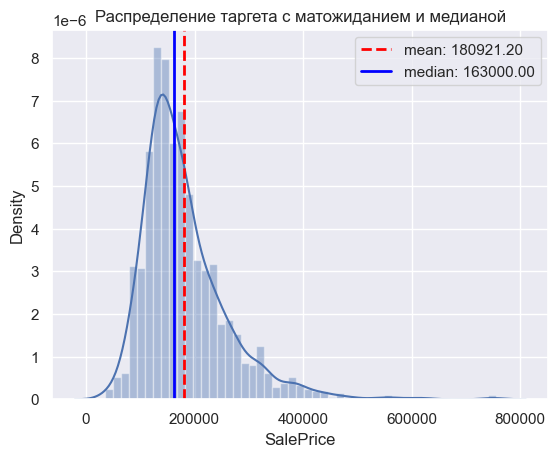

In [27]:
sns.distplot(target)
plt.axvline(target.mean(), color='red', linestyle='--', linewidth=2, label=f'mean: {target.mean():.2f}')
plt.axvline(target.median(), color='blue', linestyle='-', linewidth=2, label=f'median: {target.median():.2f}')
plt.title('Распределение таргета с матожиданием и медианой')
plt.xlabel('SalePrice')
plt.ylabel('Density')
plt.legend()
plt.show()

Матожидание смещено вправо относительно основной массы данных. Это типично для данных о ценах, где существует небольшое количество высоких значений (дорогих домов), сильно увеличивающих среднее значение. Для понимания "типичной" цены, лучше использовать медиану, так как она менее чувствительна к выбросам.

### Построим графики распределения для изучения числовых данных, их распределения и возможных выбросов

Для начала разделим числовые непрервывные и дискретные, тк для них графики будут отличаться

In [31]:
df[num_data].sample(10)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice
508,70,60.0,9600,7,9,0.0,141.0,0.0,548.0,689.0,689,689,0,1378,0.0,0.0,2,0,3,1,7,1,1928.0,2.0,360.0,0,0,116,0,0,0,0,10,161000.0
1405,120,44.0,3842,8,5,174.0,1373.0,0.0,221.0,1594.0,1646,0,0,1646,1.0,1.0,2,0,2,1,5,1,2004.0,2.0,482.0,128,53,0,0,155,0,0,1,275000.0
1016,20,73.0,11883,7,5,196.0,690.0,0.0,814.0,1504.0,1504,0,0,1504,1.0,0.0,2,0,3,1,6,1,1996.0,2.0,478.0,115,66,0,0,0,0,0,6,203000.0
29,30,60.0,6324,4,6,0.0,0.0,0.0,520.0,520.0,520,0,0,520,0.0,0.0,1,0,1,1,4,0,1920.0,1.0,240.0,49,0,87,0,0,0,0,5,68500.0
1033,20,NaN,8125,7,5,295.0,986.0,0.0,668.0,1654.0,1654,0,0,1654,1.0,0.0,2,0,3,1,6,0,2002.0,3.0,900.0,0,136,0,0,0,0,0,2,230000.0
1343,50,57.0,7558,6,6,0.0,0.0,0.0,896.0,896.0,1172,741,0,1913,0.0,0.0,1,1,3,1,9,1,1929.0,2.0,342.0,0,0,0,0,0,0,0,3,177000.0
933,20,63.0,8487,7,5,210.0,20.0,0.0,1480.0,1500.0,1500,0,0,1500,0.0,0.0,2,0,3,1,6,0,2004.0,2.0,570.0,192,36,0,0,0,0,0,8,190000.0
1019,120,43.0,3013,7,5,145.0,16.0,0.0,1346.0,1362.0,1506,0,0,1506,0.0,0.0,2,0,2,1,6,1,2005.0,2.0,440.0,142,20,0,0,0,0,0,4,213490.0
1020,20,60.0,7024,4,5,0.0,1024.0,0.0,108.0,1132.0,1132,0,0,1132,1.0,0.0,1,1,2,1,5,0,2005.0,2.0,451.0,252,64,0,0,0,0,0,6,176000.0
658,50,78.0,17503,6,5,0.0,0.0,0.0,912.0,912.0,912,546,0,1458,0.0,1.0,1,0,3,1,6,1,1948.0,1.0,330.0,192,0,0,0,0,0,0,1,97500.0


In [32]:
disc_data = [col for col in df[num_data].columns if df[col].dtype in ['int64', 'int32'] and df[col].nunique() < 50]
cont_data = [x for x in num_data if x not in disc_data]
len(disc_data), len(cont_data)

(14, 20)

#### Напишем функции для визуализации дискретных и непрерывных числовых признаков.
*Для непрерывных*:
- Построим гистограмму для оценки распределения;
- Добавим KDE-график, чтобы увидеть более плавное распределение;
- Построим боксплот для обнаружения выбросов.

*Для дискретных*:
- Построим столбчатую диаграмму для выявления преобладающих категории, редких значений и дисбаланса в данных;
- Построим боксплот, чтобы понять, как целевая переменная распределена для каждой категории дискретной переменной.


In [34]:
#для непрерывных
def plots_cont_data(df, cols):
    
    nrows = len(cols)
    ncols = 3           
    fig, axs = plt.subplots(figsize = (15, 5*nrows), nrows = nrows, ncols = ncols)
    axs = axs.reshape(nrows, ncols)

    for i, col in enumerate(cols):
        mean = df[col].mean()
        median = df[col].median()

        #hist
        sns.histplot(df[col], bins = 30, kde = False, ax = axs[i, 0], color = 'skyblue')
        axs[i, 0].axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Матожидание: {mean:.2f}')
        axs[i, 0].axvline(median, color='green', linestyle='-', linewidth=2, label=f'Медиана: {median:.2f}')
        axs[i, 0].legend()
        axs[i, 0].set_title(f'Гистограмма: {col}')
        axs[i, 0].set_xlabel(col)
        axs[i, 0].set_ylabel('Частота')

        #kde
        sns.kdeplot(df[col], shade=True, ax=axs[i, 1], color = 'orange')
        axs[i, 1].axvline(mean, color='red', linestyle='--', linewidth=2, label='Матожидание')
        axs[i, 1].axvline(median, color='green', linestyle='-', linewidth=2, label='Медиана')
        axs[i, 1].legend()
        axs[i, 1].set_title(f'KDE-график: {col}')
        axs[i, 1].set_xlabel(col)
        axs[i, 1].set_ylabel('Плотность')
        
        sns.boxplot(x=df[col], ax=axs[i, 2], color='lightgreen')
        axs[i, 2].set_title(f'Боксплот: {col}')
        axs[i, 2].set_xlabel(col)
    
    plt.tight_layout()
    plt.show()
    
#для дискетных
def plots_disc_data(df, cols, target):
    
    nrows = len(cols)  
    ncols = 2        
    fig, axs = plt.subplots(figsize=(18, 5*nrows), nrows = nrows, ncols = ncols)
    
    for i, col in enumerate(cols):
        mean = df[col].mean()
        median = df[col].median()
       
        value_counts = df[col].value_counts()
        sns.barplot(x=value_counts.index, y=value_counts.values, ax=axs[i, 0], palette='deep')
        axs[i, 0].axvline(mean, color='red', linestyle='--', linewidth=2, label=f'Матожидание: {mean:.2f}')
        axs[i, 0].axvline(median, color='green', linestyle='-', linewidth=2, label=f'Медиана: {median:.2f}')
        axs[i, 0].legend()
        axs[i, 0].set_title(f'Barplot для {col}')
        axs[i, 0].set_ylabel('Количество')

        
        # box
        sns.boxplot(x=df[col], y=target, ax=axs[i, 1], palette='Set2')
        axs[i, 1].set_title(f'Боксплот: {col} vs {target.name}')
        axs[i, 1].set_xlabel(col)
    
    plt.tight_layout()
    plt.show()

#для категориальных
def plots_cat_data(df, cols):
    for col in cols:
        value_counts = df[col].value_counts()
        unique_values = len(value_counts)
        
        if unique_values > 10:
            summary_table = pd.DataFrame({
                'Значение': value_counts.index,
                'Количество': value_counts.values,
                'Процент': (value_counts.values / len(df[col]) * 100).round(2)
            })
            print(f"\nТаблица значений для {col}:\n")
            print(summary_table.to_string(index=False))
        else:
            fig, axs = plt.subplots(1, 2, figsize=(12, 5))
            
            sns.barplot(x=value_counts.index, y=value_counts.values, ax=axs[0], palette='deep')
            axs[0].set_title(f'Barplot для {col}')
            axs[0].set_ylabel('Количество')
            for i, v in enumerate(value_counts.values):
                axs[0].text(i, v, str(v), ha='center', fontsize=10)
            
            value_counts.plot(kind='pie', ax=axs[1], autopct='%1.1f%%', colors=sns.color_palette('deep'))
            axs[1].set_title(f'Pie Chart для {col}')
            axs[1].set_ylabel('')
            
            plt.tight_layout()
            plt.show()

### Графики для непрерывных числовых признаков

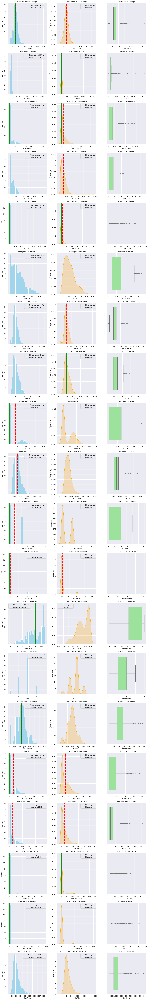

In [36]:
plots_cont_data(df, cont_data)

## LotFrontage
- **Распределение:** Близко к нормальному, с небольшим смещением вправо.
- **Среднее и медиана:** Среднее значение — 70.05, медиана — 69.00, что указывает на небольшое количество более высоких значений.
- **Выбросы:** Выбросы присутствуют, в основном в диапазоне выше 200.

## LotArea
- **Распределение:** Сильно скошено вправо, большинство значений находятся в диапазоне до 20,000.
- **Среднее и медиана:** Среднее значение — 10516.83, медиана — 9478.50, что говорит о влиянии нескольких больших значений.
- **Выбросы:** Выбросы значительны, встречаются значения выше 50,000.

## MasVnrArea
- **Распределение:** Большинство значений равны 0, указывая на отсутствие облицовки в большинстве домов. Распределение сильно скошено вправо.
- **Среднее и медиана:** Среднее значение составляет 103.69, медиана равна 0.
- **Выбросы:** Значительные выбросы наблюдаются для значений выше 500.

## BsmtFinSF1
- **Распределение:** Большинство значений находятся в диапазоне до 1000, с длинным хвостом вправо.
- **Среднее и медиана:** Среднее значение составляет 443.64, медиана равна 383.50.
- **Выбросы:** Наблюдаются выбросы для значений выше 2000.

## BsmtFinSF2
- **Распределение:** Почти все значения равны 0, что указывает на редкость отделанных дополнительных подвалов. Распределение скошено вправо.
- **Среднее и медиана:** Среднее значение составляет 46.55, медиана равна 0.
- **Выбросы:** Наблюдаются значительные выбросы для значений выше 500.

## BsmtUnfSF
- **Распределение:** Большинство значений находятся в диапазоне до 1000, с умеренным смещением вправо.
- **Среднее и медиана:** Среднее значение составляет 567.24, медиана — 477.50.
- **Выбросы:** Выбросы наблюдаются в диапазоне выше 1500.

## TotalBsmtSF
- **Распределение:** Большинство значений сосредоточены в пределах 1000–1500, с небольшим хвостом вправо.
- **Среднее и медиана:** Среднее значение составляет 1057.43, медиана — 991.50.
- **Выбросы:** Выбросы есть для значений выше 3000.

## 1stFlrSF
- **Распределение:** Значения сосредоточены около 1000–1500, с небольшим смещением вправо.
- **Среднее и медиана:** Среднее значение — 1162.63, медиана — 1087.00.
- **Выбросы:** Присутствуют выбросы для значений выше 2500.

## 2ndFlrSF
- **Распределение:** Большинство значений равны нулю, что указывает на отсутствие второго этажа в большинстве домов.
- **Среднее и медиана:** Среднее значение составляет 346.99, медиана — 0.
- **Выбросы:** Наблюдаются выбросы для значений выше 2000.

## GrLivArea
- **Распределение:** Близко к нормальному распределению, с длинным хвостом вправо.
- **Среднее и медиана:** Среднее значение составляет 1515.46, медиана — 1464.00.
- **Выбросы:** Присутствуют выбросы для значений выше 4000.

## GarageYrBlt
- **Распределение:** Двумодальное распределение с пиками около 1920-х и 2000-х годов.
- **Среднее и медиана:** Среднее значение составляет 1978.51, медиана — 1980.00.
- **Выбросы:** Значительных выбросов не выявлено.

## GarageArea
- **Распределение:** Значения сосредоточены в диапазоне до 1000, с длинным хвостом вправо.
- **Среднее и медиана:** Среднее значение составляет 472.98, медиана — 480.00.
- **Выбросы:** Наблюдаются выбросы для значений выше 1200.

## WoodDeckSF
- **Распределение:** Большинство значений равны нулю, что указывает на отсутствие деревянных террас у большинства домов.
- **Среднее и медиана:** Среднее значение составляет 94.24, медиана — 0.
- **Выбросы:** Присутствуют выбросы для значений выше 600.

## OpenPorchSF
- **Распределение:** Большинство значений находятся в диапазоне до 100, с длинным хвостом вправо.
- **Среднее и медиана:** Среднее значение составляет 46.86, медиана — 25.00.
- **Выбросы:** Наблюдаются выбросы для значений выше 400.

### Графики для дискретных числовых признаков

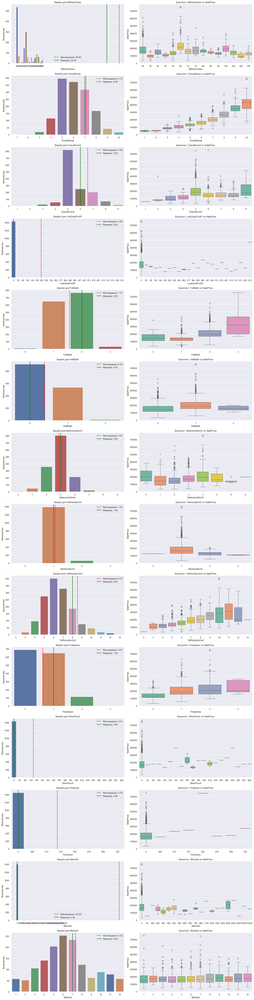

In [39]:
plots_disc_data(df, disc_data, target)

## MSSubClass
- **Преобладающая категория:** Класс `20` (одноэтажные дома 1946 года и новее) встречается наиболее часто.
- **Редкие значения:** Классы `120`, `150`, `160`, и `180` встречаются крайне редко.
- **Связь с ценой:** Более высокие классы (например, `120`, `150`, `160`) ассоциируются с более высокими ценами.

## OverallQual
- **Распределение:** Большинство домов имеют оценку качества `5-7`.
- **Связь с ценой:** Наблюдается явная положительная зависимость между качеством дома и ценой продажи.

## OverallCond
- **Распределение:** Оценка `5` преобладает.
- **Связь с ценой:** Влияние общего состояния на цену менее выражено по сравнению с качеством.

## LowQualFinSF
- **Распределение:** Низкокачественная отделка практически отсутствует в большинстве домов.
- **Связь с ценой:** Значения выше нуля имеют минимальное влияние на цену.

## BsmtFullBath и BsmtHalfBath
- **Распределение:** Полные ванные комнаты в подвале (`BsmtFullBath`) чаще встречаются, чем половинные (`BsmtHalfBath`).
- **Связь с ценой:** Наличие ванной комнаты в подвале положительно влияет на цену.

## FullBath и HalfBath
- **Распределение:** Большинство домов имеют `1-2` полные ванные комнаты (`FullBath`) и редко более одной половинной ванной комнаты (`HalfBath`).
- **Связь с ценой:** Полные ванные комнаты имеют более значительное влияние на цену, чем половинные.

## BedroomAbvGr
- **Распределение:** Основное количество домов имеют `3` спальни.
- **Связь с ценой:** Увеличение числа спален влияет на цену, но зависимость не является линейной.

## KitchenAbvGr
- **Распределение:** Почти все дома имеют только одну кухню.
- **Связь с ценой:** Дома с более чем одной кухней встречаются редко и имеют более высокие цены.

## Fireplaces
- **Распределение:** Большинство домов имеют `0-1` камин.
- **Связь с ценой:** Наличие каминов положительно влияет на цену продажи.

## GarageCars
- **Распределение:** Дома с гаражом на `2` машины наиболее распространены.
- **Связь с ценой:** Чем больше вместимость гаража, тем выше цена.

## PoolArea
- **Распределение:** Бассейны присутствуют крайне редко.
- **Связь с ценой:** Наличие бассейна существенно увеличивает цену.

## MiscVal
- **Распределение:** Большинство домов не имеют дополнительных ценных особенностей.
- **Связь с ценой:** Высокие значения `MiscVal` иногда ассоциируются с высокими ценами, но связь не линейная.

## MoSold
- **Распределение:** Продажи чаще происходят в летние месяцы (май-июль).
- **Связь с ценой:** Сезонность оказывает незначительное влияние на цену продажи.


### Графики для категориальных числовых

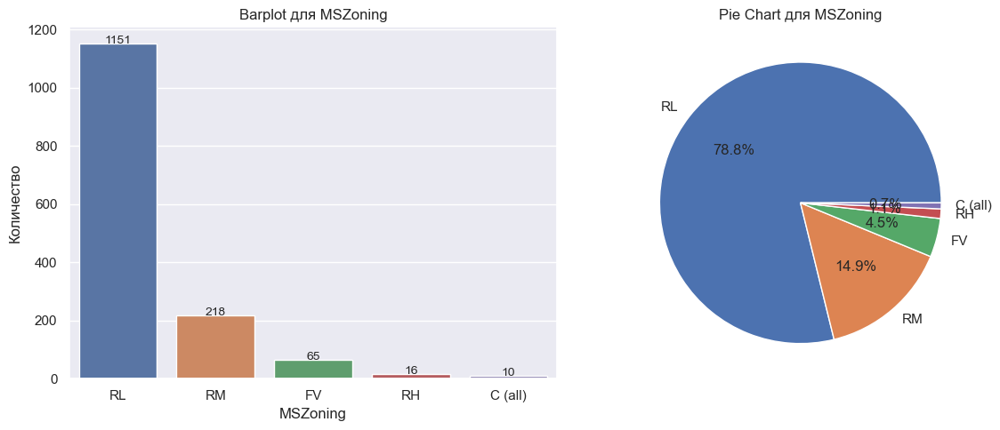

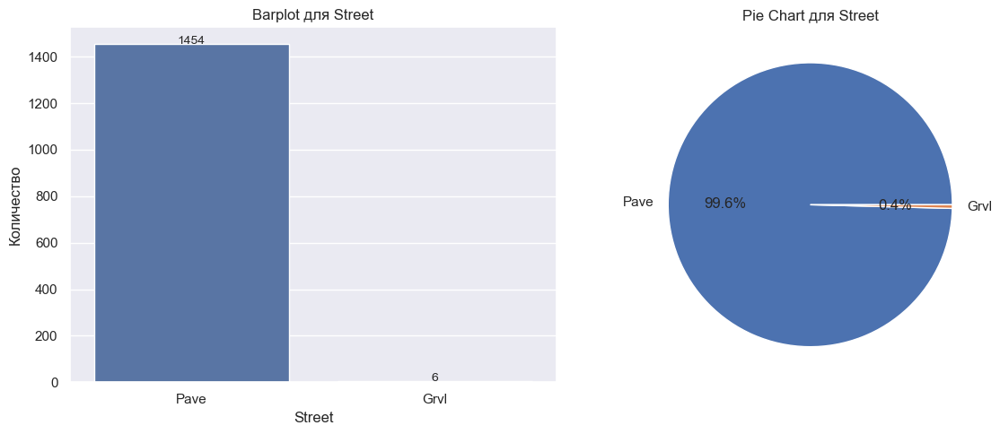

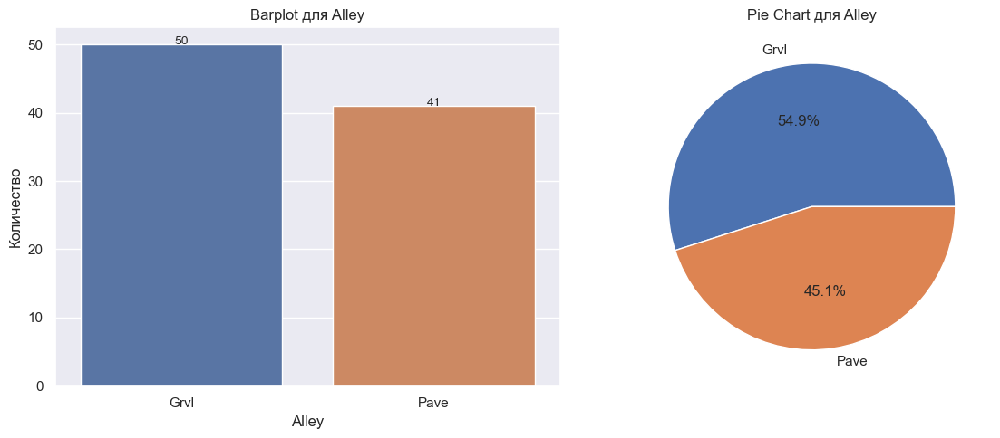

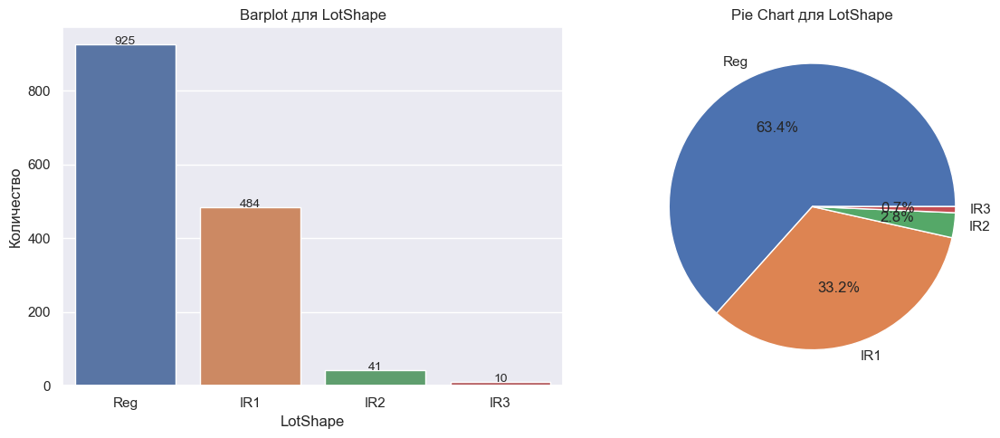

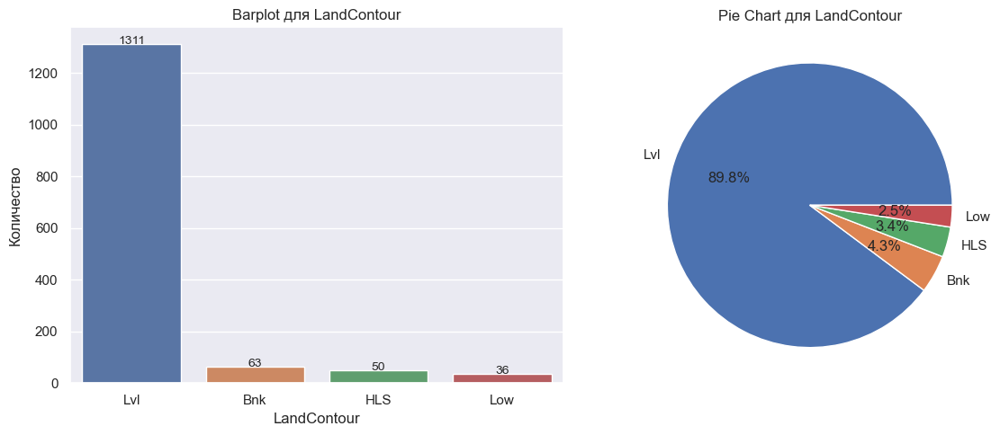

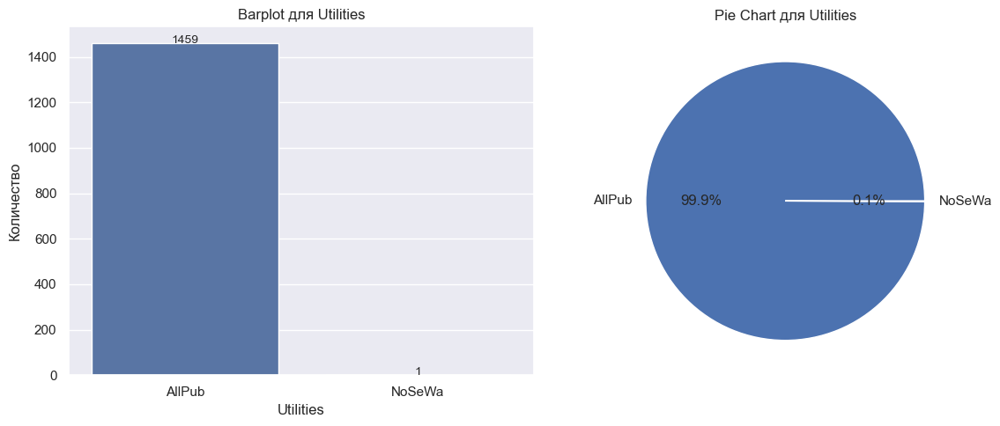

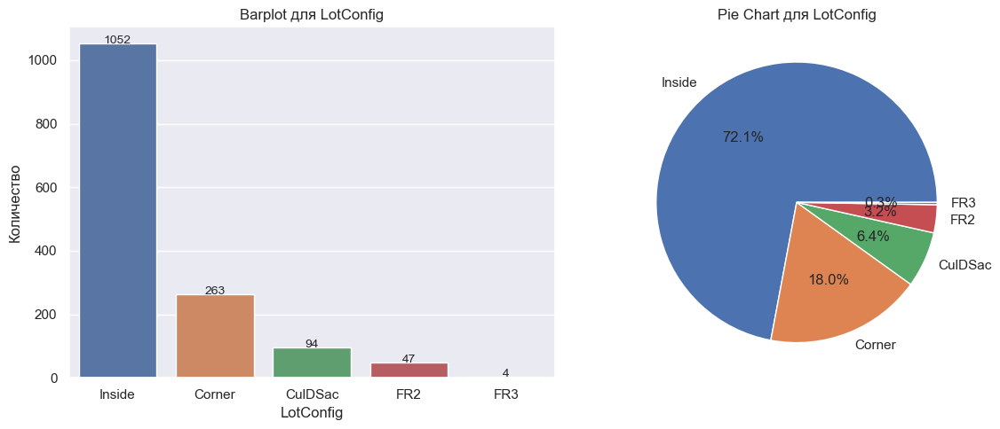

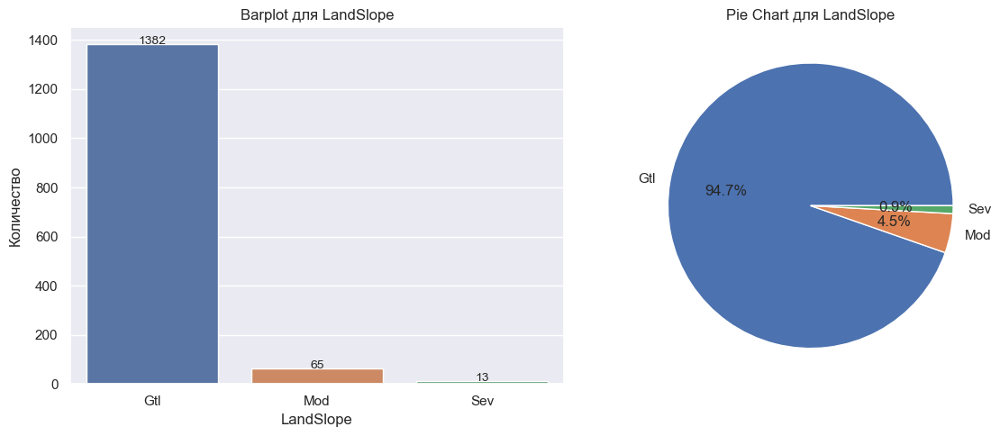


Таблица значений для Neighborhood:

Значение  Количество  Процент
   NAmes         225    15.41
 CollgCr         150    10.27
 OldTown         113     7.74
 Edwards         100     6.85
 Somerst          86     5.89
 Gilbert          79     5.41
 NridgHt          77     5.27
  Sawyer          74     5.07
  NWAmes          73     5.00
 SawyerW          59     4.04
 BrkSide          58     3.97
 Crawfor          51     3.49
 Mitchel          49     3.36
 NoRidge          41     2.81
  Timber          38     2.60
  IDOTRR          37     2.53
 ClearCr          28     1.92
 StoneBr          25     1.71
   SWISU          25     1.71
 MeadowV          17     1.16
 Blmngtn          17     1.16
  BrDale          16     1.10
 Veenker          11     0.75
 NPkVill           9     0.62
 Blueste           2     0.14


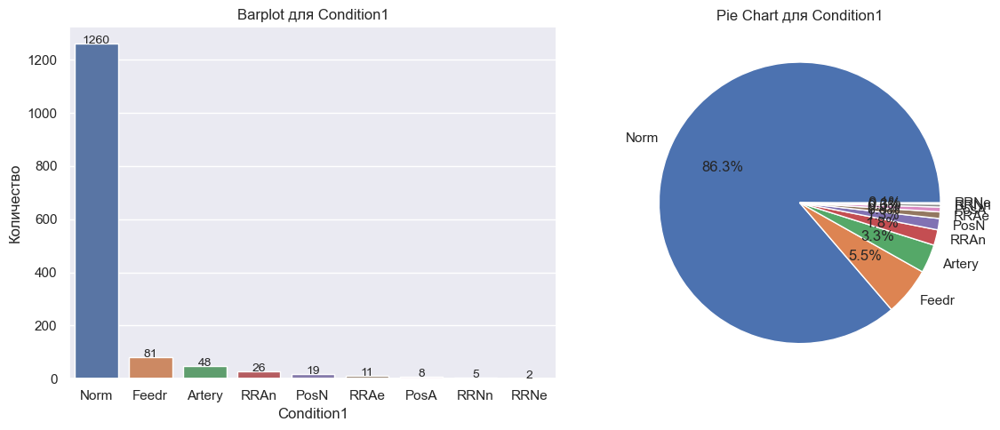

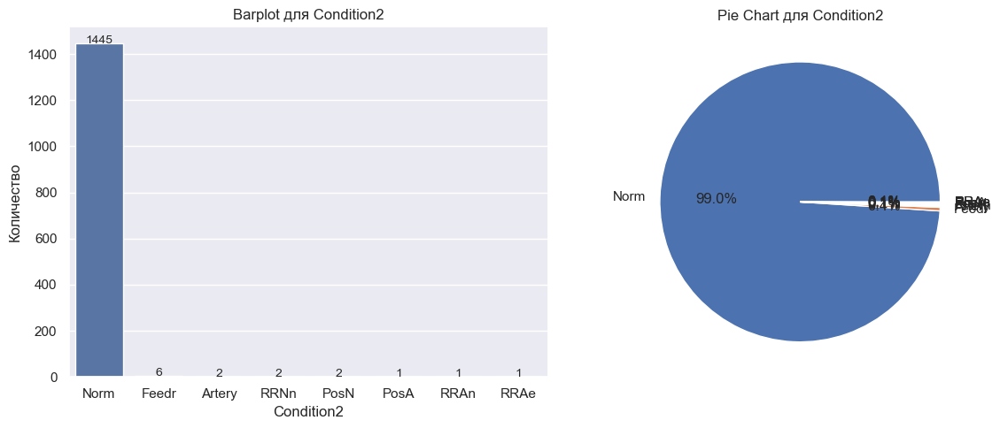

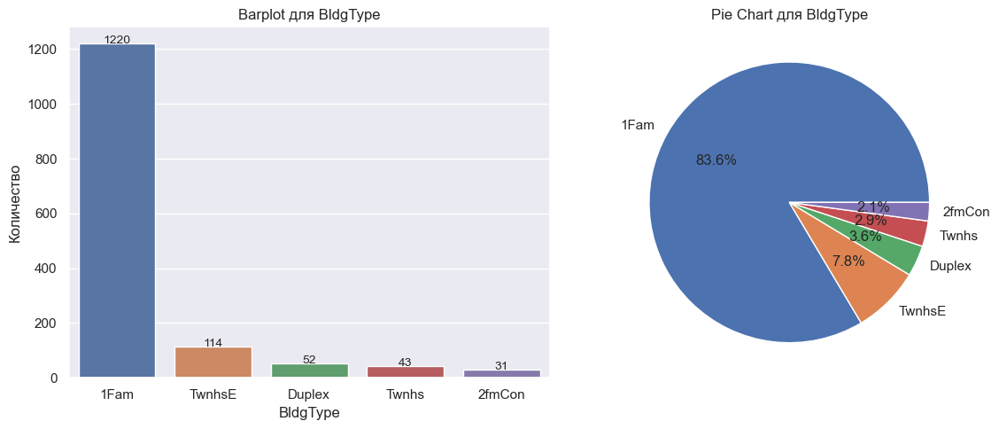

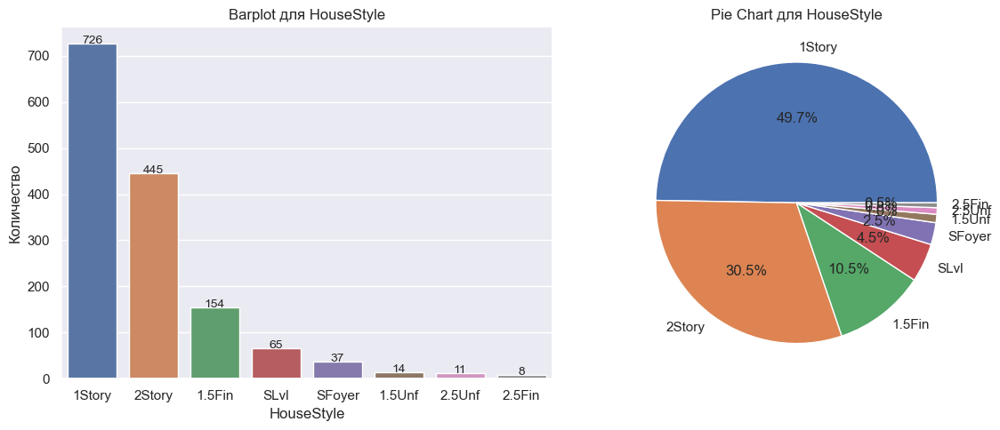

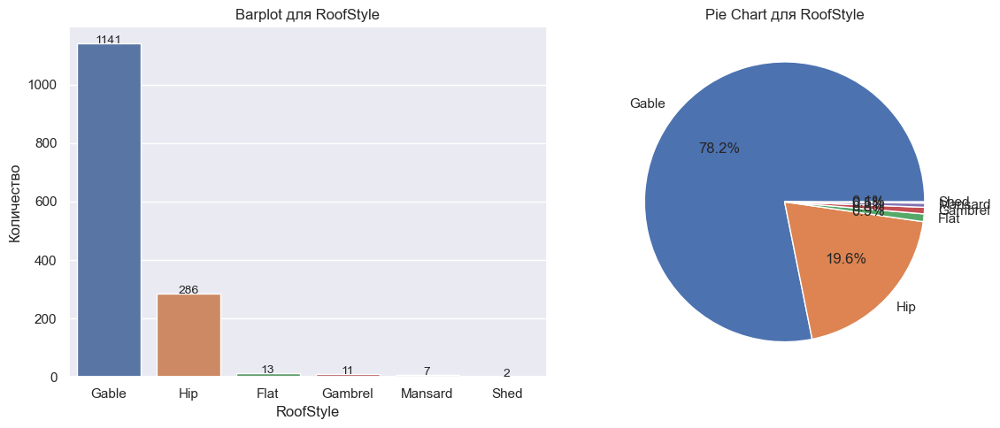

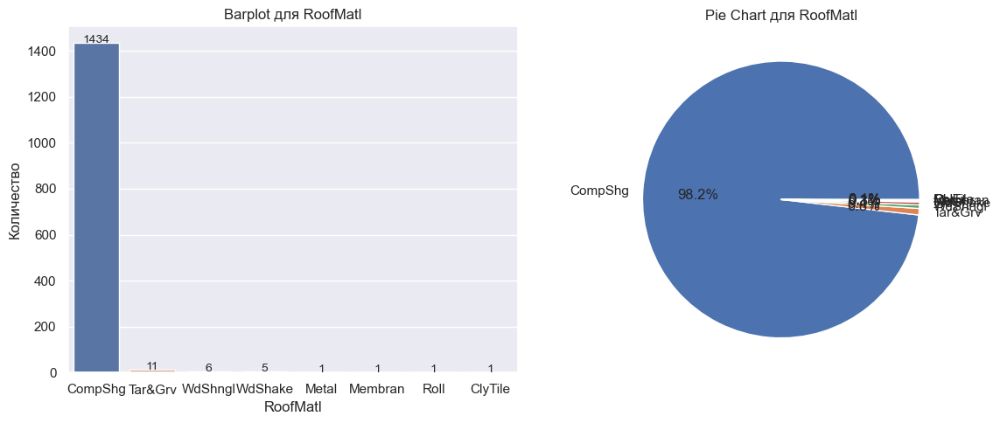


Таблица значений для Exterior1st:

Значение  Количество  Процент
 VinylSd         515    35.27
 HdBoard         222    15.21
 MetalSd         220    15.07
 Wd Sdng         206    14.11
 Plywood         108     7.40
 CemntBd          61     4.18
 BrkFace          50     3.42
 WdShing          26     1.78
  Stucco          25     1.71
 AsbShng          20     1.37
 BrkComm           2     0.14
   Stone           2     0.14
 AsphShn           1     0.07
 ImStucc           1     0.07
  CBlock           1     0.07

Таблица значений для Exterior2nd:

Значение  Количество  Процент
 VinylSd         504    34.52
 MetalSd         214    14.66
 HdBoard         207    14.18
 Wd Sdng         197    13.49
 Plywood         142     9.73
 CmentBd          60     4.11
 Wd Shng          38     2.60
  Stucco          26     1.78
 BrkFace          25     1.71
 AsbShng          20     1.37
 ImStucc          10     0.68
 Brk Cmn           7     0.48
   Stone           5     0.34
 AsphShn           3     0.2

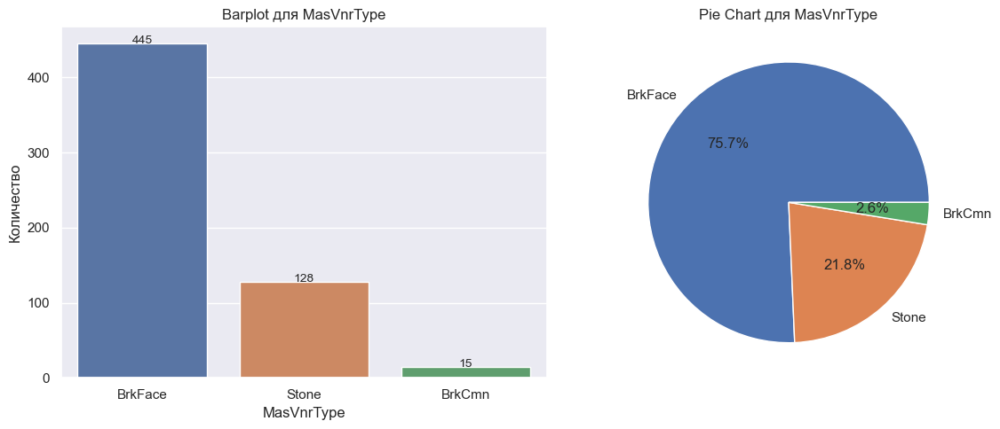

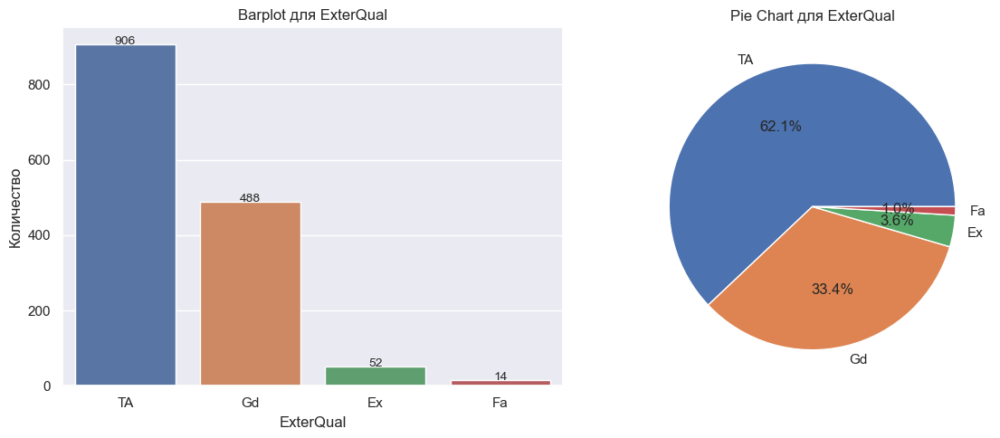

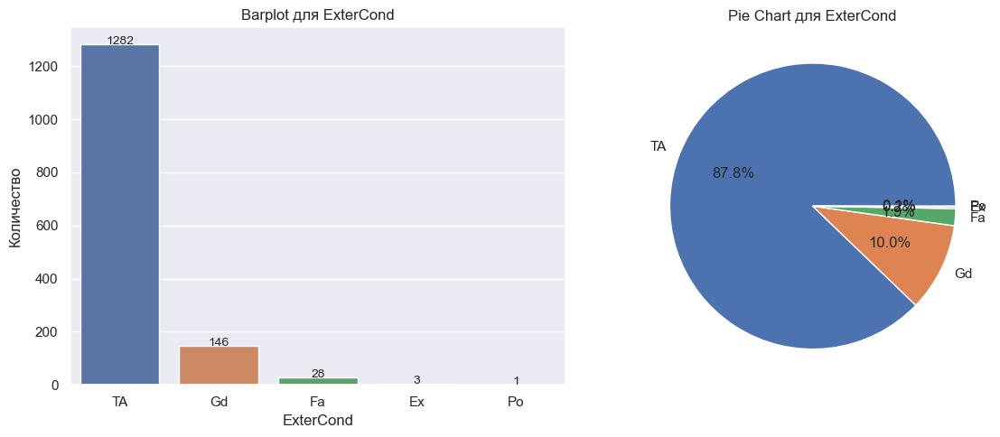

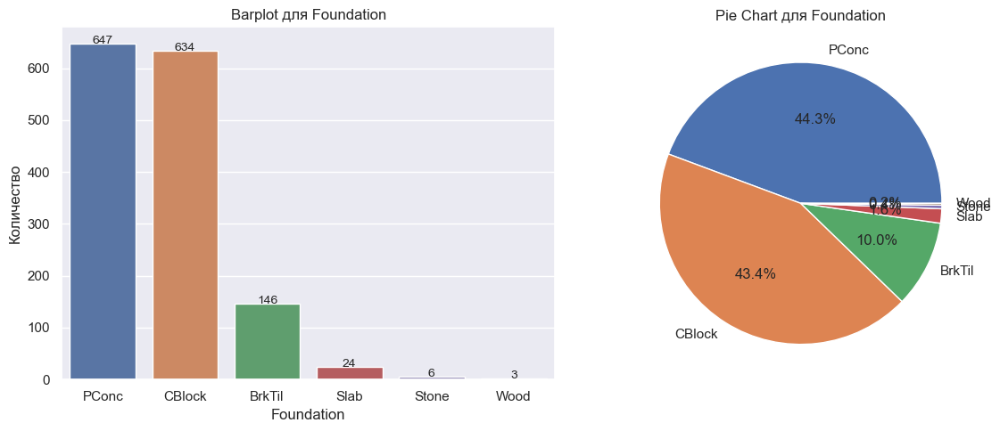

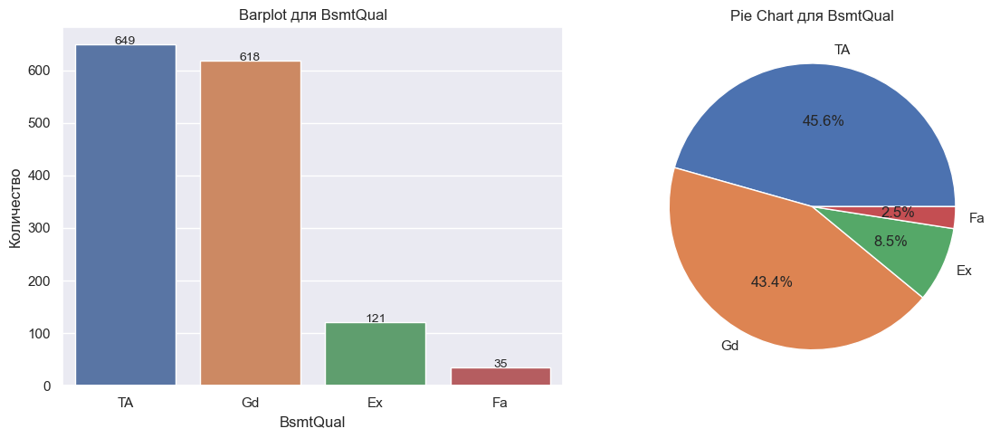

...

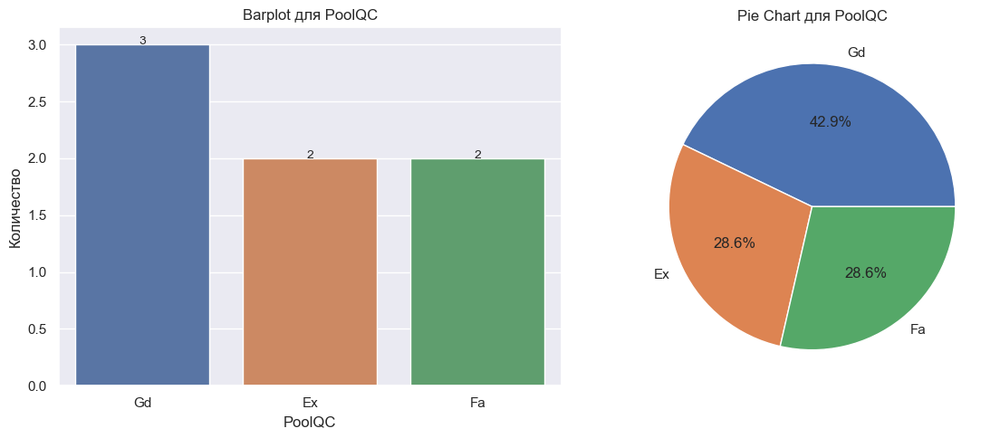

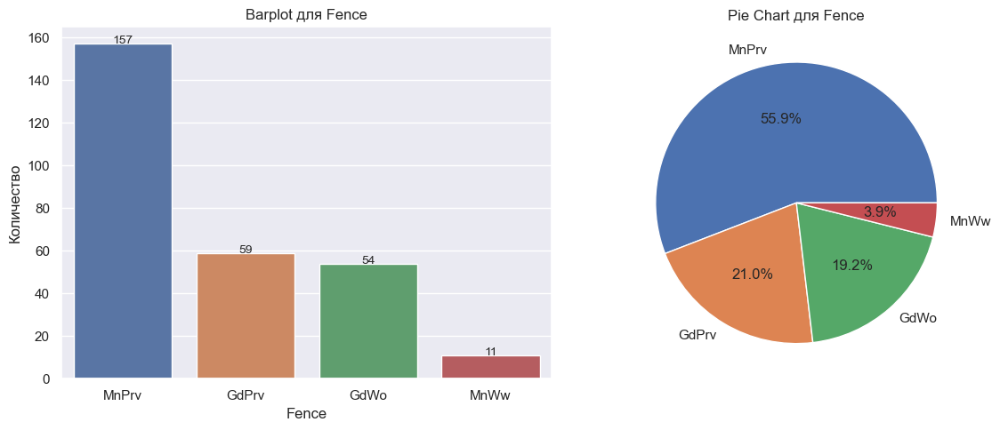

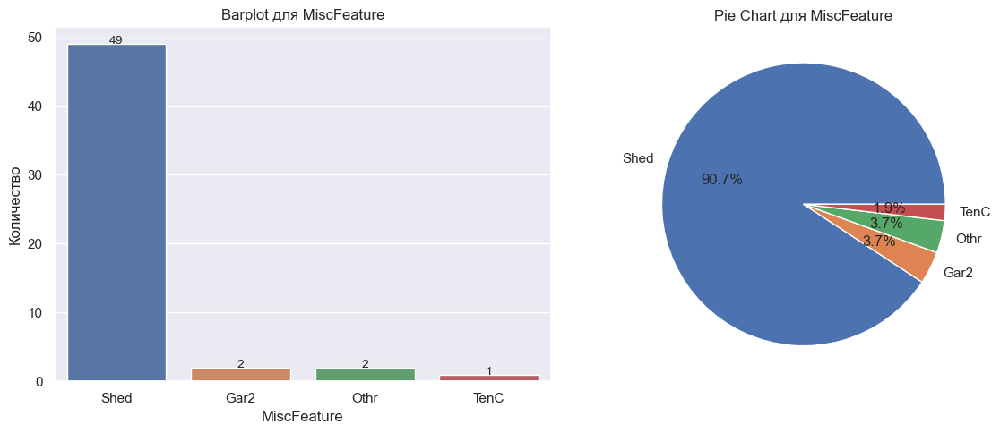

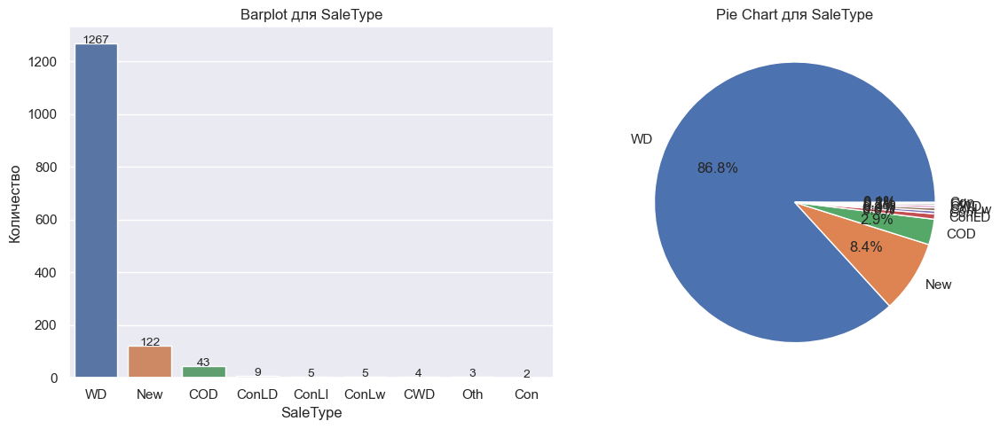

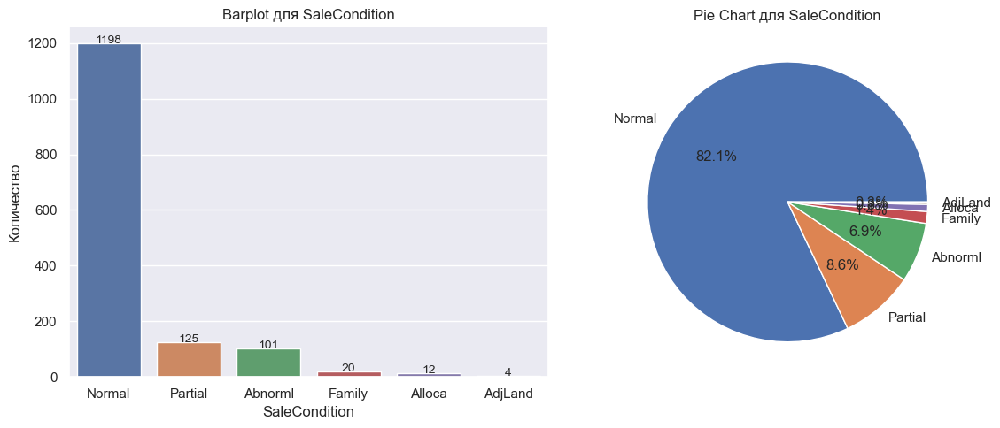

In [42]:
plots_cat_data(df, cat_data)

## MSZoning
- **Преобладающая категория:** RL (Residential Low Density) — самая популярная категория.
- **Редкие значения:** Категории RH и C встречаются крайне редко.

## Street
- **Распределение:** Почти все дороги имеют твердое покрытие (Pave). Gravel встречается только в 6 случаях.

## Alley
- **Распределение:** Доступ по гравийным (Grvl) и асфальтированным (Pave) аллеям распределен практически равномерно.

## LotShape
- **Преобладающая категория:** Reg (Regular) — наиболее распространенная форма участка.
- **Редкие значения:** IR2 и IR3 встречаются редко.

## LandContour
- **Распределение:** Большинство участков имеют ровную поверхность (Lvl).
- **Редкие значения:** Сложные контуры, такие как Low, встречаются крайне редко.

## Utilities
- **Распределение:** Почти все дома имеют полные коммунальные услуги (AllPub).

## LotConfig
- **Преобладающая категория:** Inside (внутренние участки).
- **Редкие значения:** Участки с фронтажом с трех сторон (FR3) встречаются крайне редко.

## LandSlope
- **Распределение:** Почти все участки имеют небольшой уклон (Gtl).
- **Редкие значения:** Участки с сильным уклоном (Sev) редки.

## Neighborhood
- **Наиболее популярные районы:** NAmes, CollgCr и OldTown.
- **Редкие районы:** Blueste, NPkVill и Veenker.

## Condition1 и Condition2
- **Распределение:** Большинство домов расположены в нормальных условиях (Norm). Остальные категории встречаются редко.

## BldgType
- **Преобладающая категория:** 1Fam (односемейные дома).
- **Редкие значения:** 2fmCon и Twnhs встречаются редко.

## HouseStyle
- **Преобладающая категория:** 1Story (одноэтажные дома).
- **Редкие стили:** 2.5Unf и 2.5Fin.

## RoofStyle
- **Преобладающая категория:** Gable (двускатная крыша).
- **Редкие стили:** Shed и Mansard.

## RoofMatl
- **Распределение:** Почти все крыши выполнены из композитной черепицы (CompShg).
- **Редкие материалы:** Membran, Roll и ClyTile.

## Exterior1st и Exterior2nd
- **Популярные материалы:** VinylSd, HdBoard и MetalSd.
- **Редкие материалы:** BrkComm, AsphShn и ImStucc.

### Проанализируем мультиколлинеарность между числовыми признаками

#### Корреляционная матрица

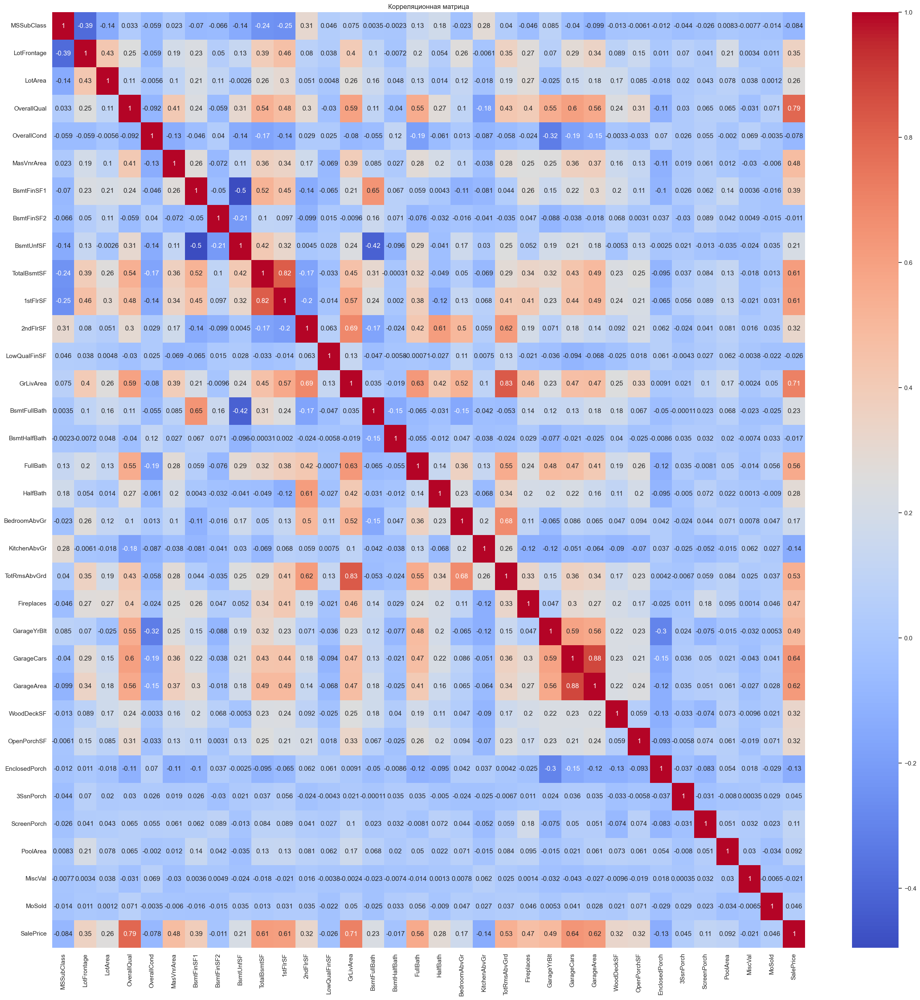

In [46]:
corr_matrix = df[num_data].corr()
plt.figure(figsize=(30, 30))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()

In [47]:
threshold = 0.7
correlation_pairs = (
    corr_matrix.where((corr_matrix > threshold) & (corr_matrix < 1))
    .stack()
    .reset_index()
)
correlation_pairs.columns = ['Var1', 'Var2', 'Correlation']
correlation_pairs

,Var1,Var2,Correlation
0,OverallQual,SalePrice,0.790982
1,TotalBsmtSF,1stFlrSF,0.819530
2,1stFlrSF,TotalBsmtSF,0.819530
3,GrLivArea,TotRmsAbvGrd,0.825489
4,GrLivArea,SalePrice,0.708624
5,TotRmsAbvGrd,GrLivArea,0.825489
6,GarageCars,GarageArea,0.882475
7,GarageArea,GarageCars,0.882475
8,SalePrice,OverallQual,0.790982
9,SalePrice,GrLivArea,0.708624


**Гараж (GarageCars и GarageArea):**

- Очень высокая корреляция (0.882475) между количеством парковочных мест (GarageCars) и площадью гаража (GarageArea). Большая площадь гаража позволяет разместить больше автомобилей.
  
**Жилая площадь (GrLivArea и TotRmsAbvGrd):**

- Значительная корреляция (0.825489) между общей площадью надземной жилой зоны (GrLivArea) и количеством комнат над уровнем земли (TotRmsAbvGrd). Большее количество комнат, как правило, связано с увеличением жилой площади.

**Подвал и первый этаж (TotalBsmtSF и 1stFlrSF):**

- Высокая корреляция (0.819530) между площадью подвала (TotalBsmtSF) и первого этажа (1stFlrSF). Это может быть связано с тем, что в большинстве домов площадь подвала примерно совпадает с площадью первого этажа.

В дальнейшем мы будем избавляться от мультиколлинеарности. Изучим, как все таки эти признаки в отдельности влияют на целевую переменную и можем оставить только одну из сильно коррелирующих переменных

### Так как для решения нашей задачи мы бы хотели обучить линейную регрессию, было бы хорошо найти признаки, "наиболее линейно" связанные с целевой переменной. 
Иначе говоря, посмотрим на коэффициент корреляции Пирсона между признаками и целевой переменной

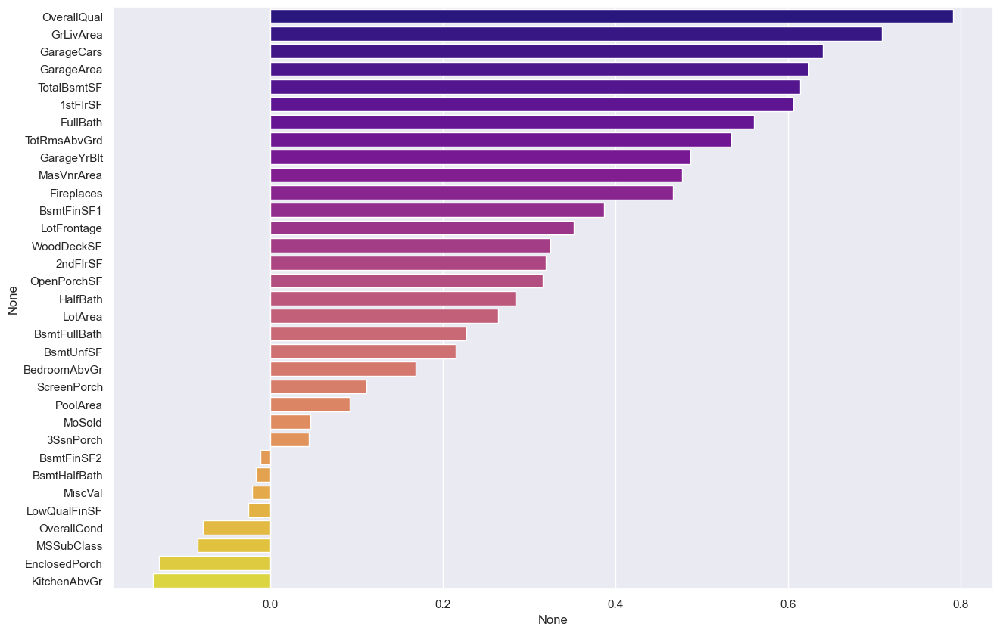

In [50]:
correlations = df[num_data].drop(["SalePrice"],axis = 1, inplace= False).corrwith(target).sort_values(ascending=False)

plot = sns.barplot(y=correlations.index, x=correlations,palette='plasma')
plot.figure.set_size_inches(15, 10)

### Посмотрим на признаки из начала списка. Для этого нарисуем график зависимости целевой переменной от каждого из признаков. На этом графике каждая точка соответствует паре признак-таргет

In [52]:
big_corr = correlations[correlations.values > 0.6]

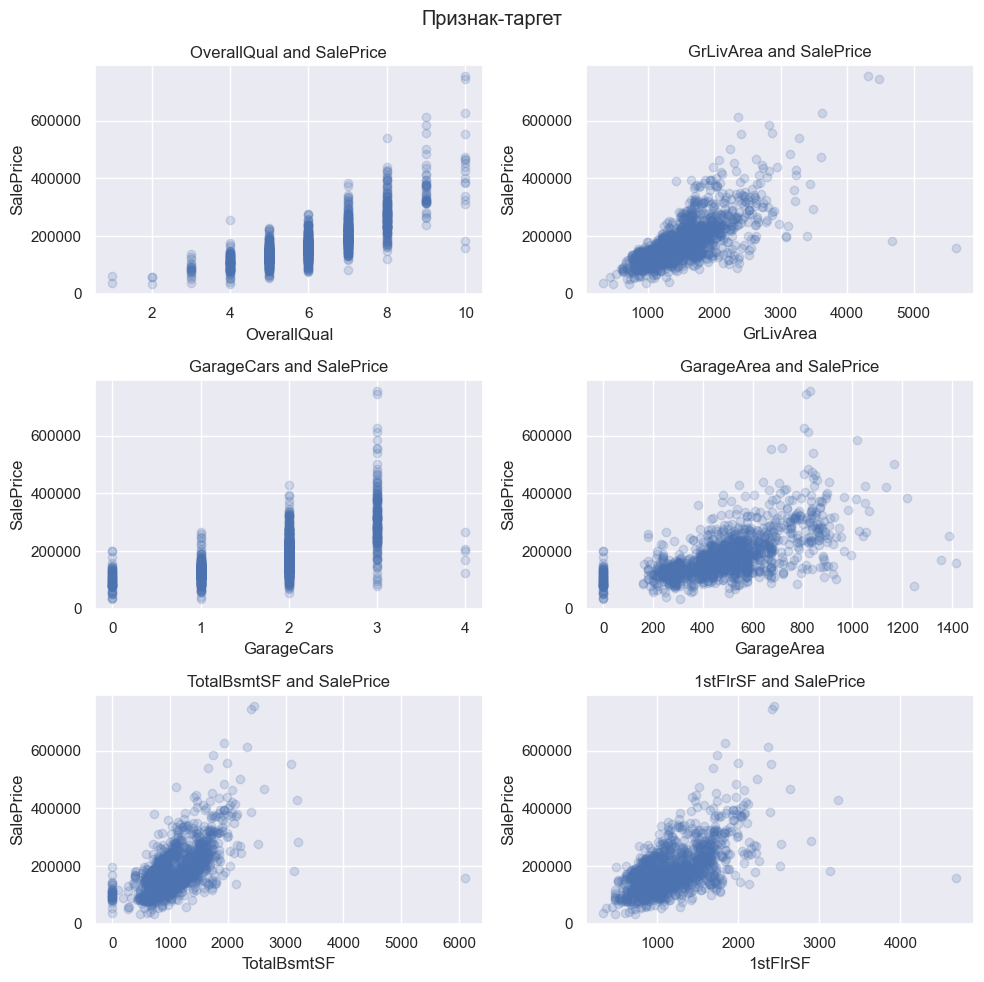

In [53]:
fig, axs = plt.subplots(figsize=(10, 10), ncols=2, nrows=3)
plt.suptitle('Признак-таргет')
for i, (col, ax) in enumerate(zip(list(big_corr.index), axs.flat)):
    ax.scatter(df[col], target, alpha=0.2)
    ax.set_title(f'{col} and SalePrice')
    ax.set_xlabel(col)
    ax.set_ylabel('SalePrice')
plt.tight_layout()

- Все признаки демонстрируют положительную зависимость с SalePrice, что говорит о том, что они могут быть полезны для предсказания.
- Выбросы: Некоторые графики (например, GrLivArea, TotalBsmtSF) содержат выбросы, которые в дальнейшем нам предстоит обработать.

## Посмотрим среднюю цену дома в зависимости от категориальных признаков

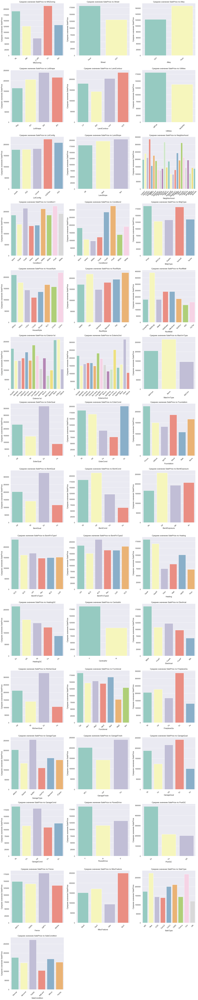

In [56]:
n_cols = 3
n_rows = math.ceil(len(cat_data) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))
axes = axes.flatten()

for idx, i in enumerate(cat_data):
    sns.barplot(data=df, x=i, y='SalePrice', ci=None, palette='Set3', ax=axes[idx])
    axes[idx].set_title(f'Среднее значение SalePrice по {i}')
    axes[idx].set_xlabel(i)
    axes[idx].set_ylabel('Среднее значение SalePrice')
    axes[idx].tick_params(axis='x', rotation=45)

for ax in axes[len(cat_data):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# Feature Engineering

## Проанализируем пропущенные значения в других столбцах датасета
#### Сначала простро аналитически посмотрим, как связаны и как могут быть заполнены пропущенные значения

In [59]:
pd.DataFrame([df.isnull().sum()[df.isnull().sum()>0],(df.isnull().sum()[df.isnull().sum()>0]/df.shape[0])*100, df_test.isnull().sum()[df_test.isnull().sum()>0],(df_test.isnull().sum()[df_test.isnull().sum()>0]/df_test.shape[0])*100], index = ["Кол-во(train)" , "% (train)", "Кол-во(test)" , "% (test)"]).T.style.background_gradient("viridis")

,Кол-во(train),% (train),Кол-во(test),% (test)
LotFrontage,259.000000,17.739726,227.000000,15.558602
Alley,1369.000000,93.767123,1352.000000,92.666210
MasVnrType,872.000000,59.726027,894.000000,61.274846
MasVnrArea,8.000000,0.547945,15.000000,1.028101
BsmtQual,37.000000,2.534247,44.000000,3.015764
BsmtCond,37.000000,2.534247,45.000000,3.084304
BsmtExposure,38.000000,2.602740,44.000000,3.015764
BsmtFinType1,37.000000,2.534247,42.000000,2.878684
BsmtFinType2,38.000000,2.602740,42.000000,2.878684
Electrical,1.000000,0.068493,nan,nan


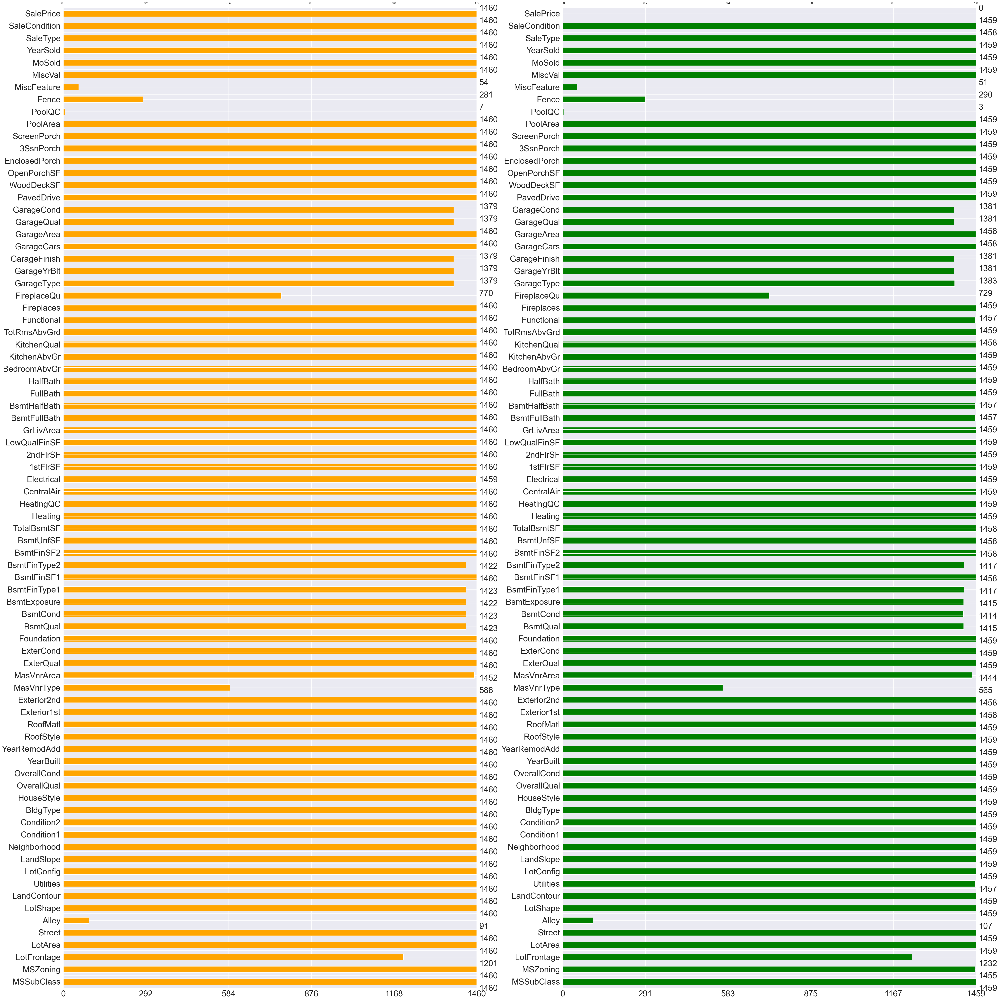

In [60]:
fig, axs = plt.subplots(1,2, figsize = (50,50))
msno.bar(df, ax = axs[0], fontsize = 30, color="orange")
msno.bar(df_test, ax = axs[1], fontsize = 30, color = "green")

plt.tight_layout()
plt.show()

<Axes: >

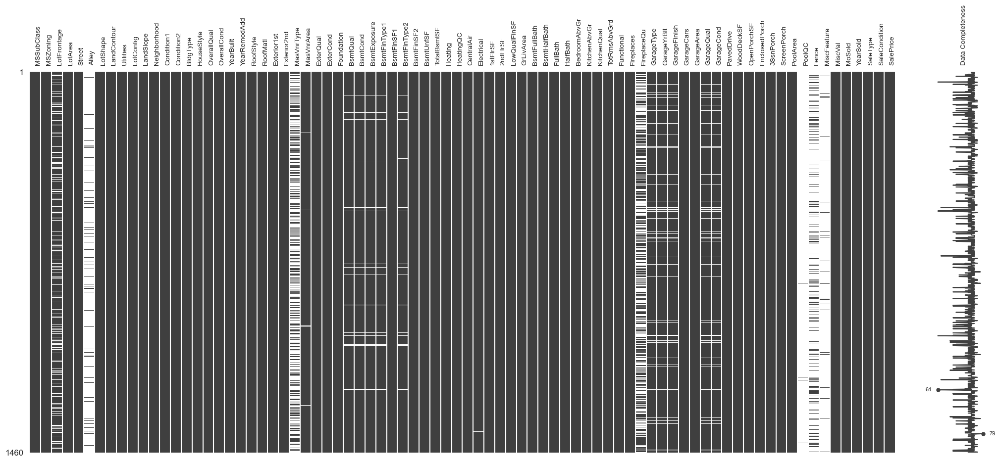

In [61]:
msno.matrix(df, labels = True, label_rotation=90, fontsize = 10)

<Axes: >

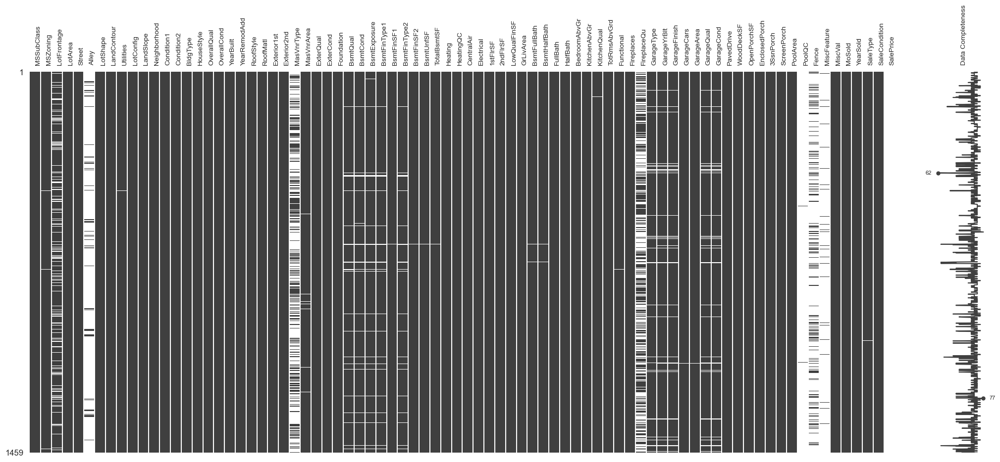

In [62]:
msno.matrix(df_test, labels = True, label_rotation=90, fontsize = 10)

Видим, что 6 переменных содержат более 40% пустых значений. Определим, почему могло такое возникнуть:

- `Alley` — NA в данном случае свидетельствует об отсутсвии доступа к аллее (No alley access), так что пропущенное значение само в себе несет смыслом и мы заменим их на значения No alley access
- `MasVnrType` — NA — действительно None. Не можем принть решение об удалении признака, будем исследовать местоположения недостающих данных и тип по Рубину
- `FireplaceQu` — NA — No Fireplace
- `PoolQC` — NA — No Pool
- `Fence` — NA — No Fence
- `MiscFeature` (Прочие элементы, не включенные в другие категории) — NA — действительно None. Количество пропусков более 96%, для дальнейшего анализа этот признак незначим, удалим его

In [64]:
df.drop(columns = ["MiscFeature", "MasVnrType"], inplace = True)
df_test.drop(columns = ["MiscFeature", "MasVnrType"], inplace = True)

In [65]:
#в описании данных посомтрим, где NA - это не пропущенное значение, а констатация отсутствия той или иной характеристики

df.fillna({"Alley": "No alley access",
          "BsmtQual": "No Basement",
          "BsmtCond": "No Basement",
          "BsmtExposure": "No Basement",
          "BsmtFinType1": "No Basement",
          "BsmtFinType2": "No Basement",
          "FireplaceQu": "No Fireplace",
          "GarageType": "No Garage",
          "GarageFinish": "No Garage",
          "GarageQual": "No Garage",
          "GarageCond": "No Garage",
          "PoolQC": "No pool",
          "Fence": "No fence"}, inplace = True)

df_test.fillna({"Alley": "No alley access",
          "BsmtQual": "No Basement",
          "BsmtCond": "No Basement",
          "BsmtExposure": "No Basement",
          "BsmtFinType1": "No Basement",
          "BsmtFinType2": "No Basement",
          "FireplaceQu": "No Fireplace",
          "GarageType": "No Garage",
          "GarageFinish": "No Garage",
          "GarageQual": "No Garage",
          "GarageCond": "No Garage",
          "PoolQC": "No pool",
          "Fence": "No fence"}, inplace = True)

Удаляем пропущенные значения в столбцах, если их оочень маленькое кол-во и мы не можем проследить связь

In [67]:
df_test.dropna(subset = ["Utilities", "Exterior1st", "Exterior2nd", "KitchenQual", "Functional", "GarageCars", "GarageArea", "SaleType", "MSZoning", "MasVnrArea"], inplace = True)
df.dropna(subset = ["Electrical", "MasVnrArea"], inplace = True)

In [68]:
pd.DataFrame([df.isnull().sum()[df.isnull().sum()>0],(df.isnull().sum()[df.isnull().sum()>0]/df.shape[0])*100, df_test.isnull().sum()[df_test.isnull().sum()>0],(df_test.isnull().sum()[df_test.isnull().sum()>0]/df_test.shape[0])*100], index = ["Кол-во(train)" , "% (train)", "Кол-во(test)" , "% (test)"]).T.style.background_gradient("viridis")

,Кол-во(train),% (train),Кол-во(test),% (test)
LotFrontage,257.000000,17.711923,221.000000,15.411437
GarageYrBlt,81.000000,5.582357,75.000000,5.230126
BsmtFinSF1,nan,nan,1.000000,0.069735
BsmtFinSF2,nan,nan,1.000000,0.069735
BsmtUnfSF,nan,nan,1.000000,0.069735
TotalBsmtSF,nan,nan,1.000000,0.069735
BsmtFullBath,nan,nan,2.000000,0.139470
BsmtHalfBath,nan,nan,2.000000,0.139470
SalePrice,nan,nan,1434.000000,100.000000


## Basement

In [70]:
df_test[[i for i in df_test.columns if "Bsmt" in i]][df_test["BsmtFinSF2"].isnull()]

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
660,No Basement,No Basement,No Basement,No Basement,NaN,No Basement,NaN,NaN,NaN,NaN,NaN


В обучающем датасете числовые переменные, связанные с характеристиками подвала, зануляются, если у дома нет подвала

In [72]:
df[[i for i in df.columns if "Bsmt" in i]][df["BsmtQual"] == "No Basement"].head()

,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
17,No Basement,No Basement,No Basement,No Basement,0.0,No Basement,0.0,0.0,0.0,0.0,0.0
39,No Basement,No Basement,No Basement,No Basement,0.0,No Basement,0.0,0.0,0.0,0.0,0.0
90,No Basement,No Basement,No Basement,No Basement,0.0,No Basement,0.0,0.0,0.0,0.0,0.0
102,No Basement,No Basement,No Basement,No Basement,0.0,No Basement,0.0,0.0,0.0,0.0,0.0
156,No Basement,No Basement,No Basement,No Basement,0.0,No Basement,0.0,0.0,0.0,0.0,0.0


In [73]:
df_test.fillna({"BsmtFinSF1" : 0.0,
               "BsmtFinSF2": 0.0,
               "BsmtUnfSF": 0.0,
               "TotalBsmtSF": 0.0,
               "BsmtFullBath": 0.0,
               "BsmtHalfBath": 0.0}, inplace = True)

## Garage

In [75]:
df[[i for i in df.columns if "Garage" in i]][df["GarageYrBlt"].isnull()]

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
39,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
48,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
78,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
88,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
89,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
...,...,...,...,...,...,...,...
1349,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
1407,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
1449,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage
1450,No Garage,NaN,No Garage,0.0,0.0,No Garage,No Garage


Видим, что в обучающем датасете признак GarageYrBlt принимает пустые значения только в случае, если нет гаража, **MAR (Missing at Random) - Пропуски случайны**

Удалим признаки, содержищий год постройки гаража и заменим его на бинарный признак есть гараж или нет гаража

In [77]:
df['Garage'] = df['GarageYrBlt'].notnull().astype(int)
df = df.drop(columns=['GarageYrBlt'])

df_test['Garage'] = df_test['GarageYrBlt'].notnull().astype(int)
df_test = df_test.drop(columns=['GarageYrBlt'])

## LotFrontage

df["LotFrontage"] — числовые значения (Linear feet of street connected to property), пропуски в этом столбце никак не зависят от пропусков в других признаках

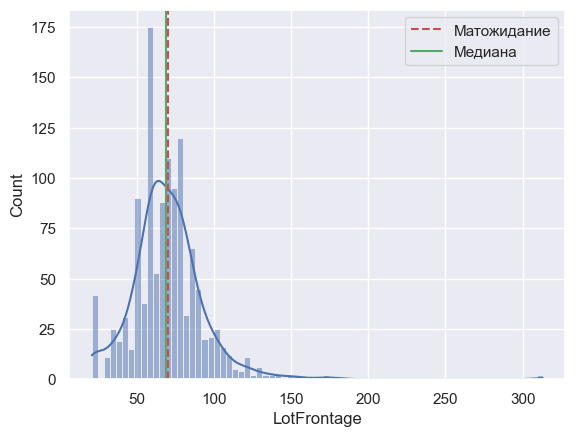

In [80]:
sns.histplot(df["LotFrontage"], kde = True)
plt.axvline(df["LotFrontage"].mean(), ls = "--", color = "r", label = "Матожидание")
plt.axvline(df["LotFrontage"].median(), ls = "-", color = "g", label= "Медиана")
plt.legend()

<Axes: xlabel='LotFrontage'>

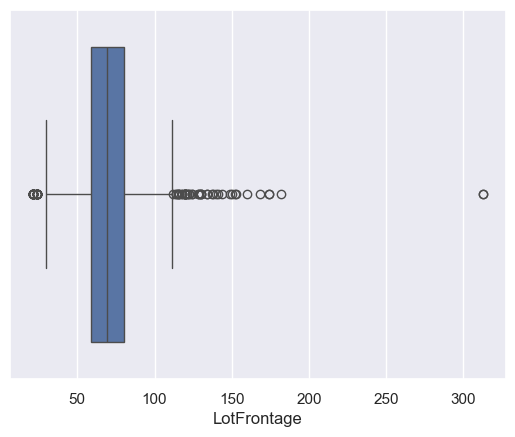

In [81]:
sns.boxplot(data= df, x = "LotFrontage")

Есть выбросы, так что заполним пропуски медианой

In [83]:
df.fillna({"LotFrontage":df.LotFrontage.median()}, inplace = True)
df_test.fillna({"LotFrontage":df_test.LotFrontage.median()}, inplace = True)

In [84]:
df_test.drop(columns = "SalePrice", inplace = True)

In [85]:
pd.DataFrame([df.isnull().sum()[df.isnull().sum()>0],(df.isnull().sum()[df.isnull().sum()>0]/df.shape[0])*100, df_test.isnull().sum()[df_test.isnull().sum()>0],(df_test.isnull().sum()[df_test.isnull().sum()>0]/df_test.shape[0])*100], index = ["Кол-во(train)" , "% (train)", "Кол-во(test)" , "% (test)"]).T.style.background_gradient("viridis")

,Кол-во(train),% (train),Кол-во(test),% (test)


## Обработка выбросов

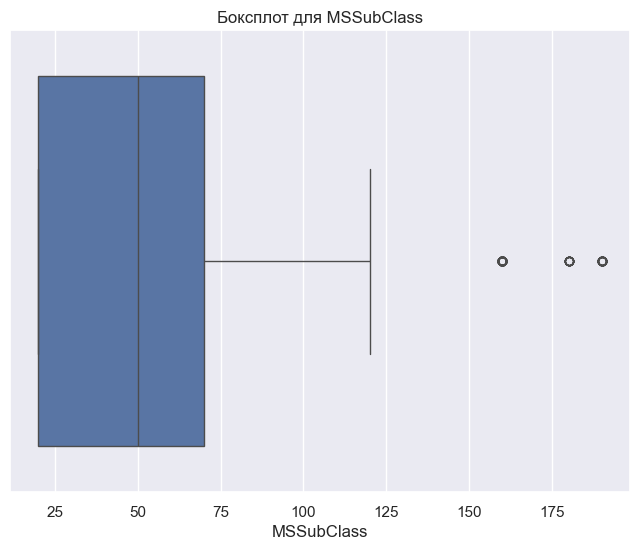

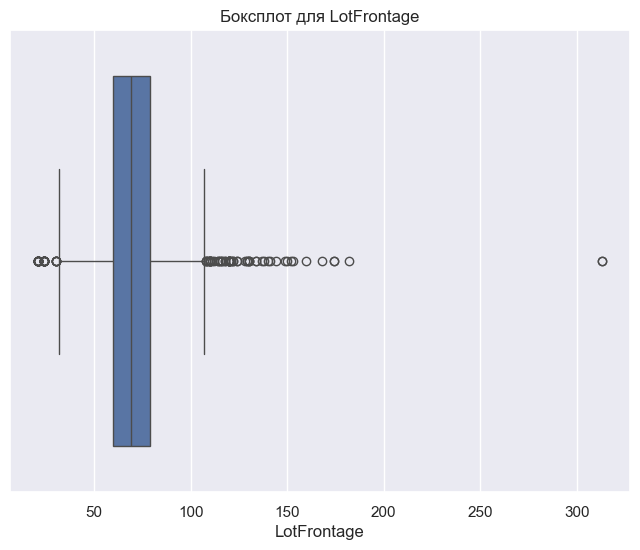

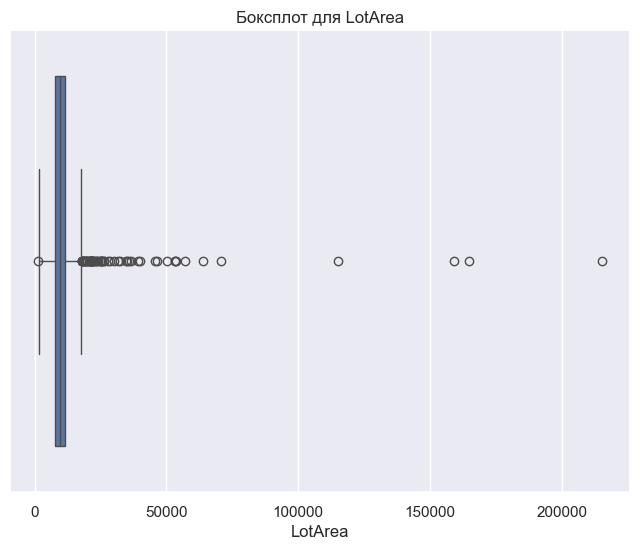

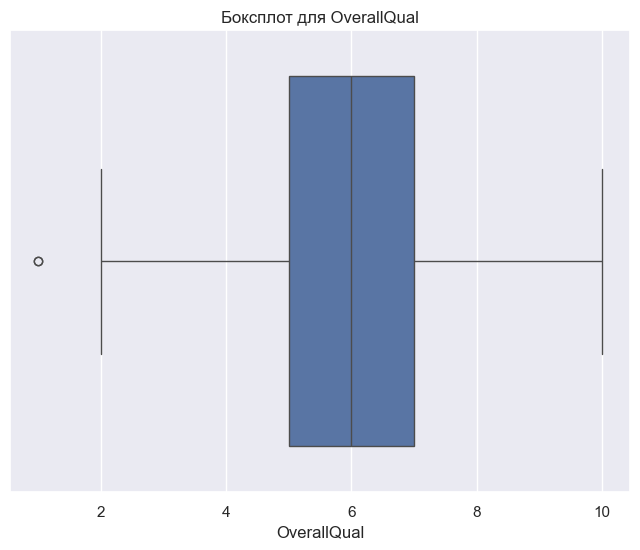

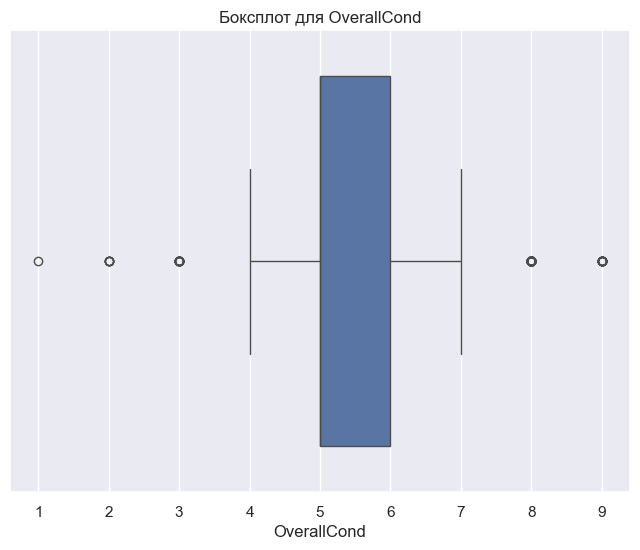

...

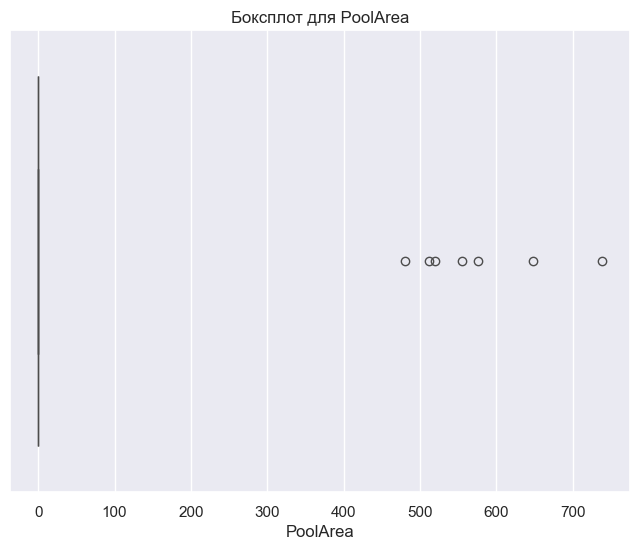

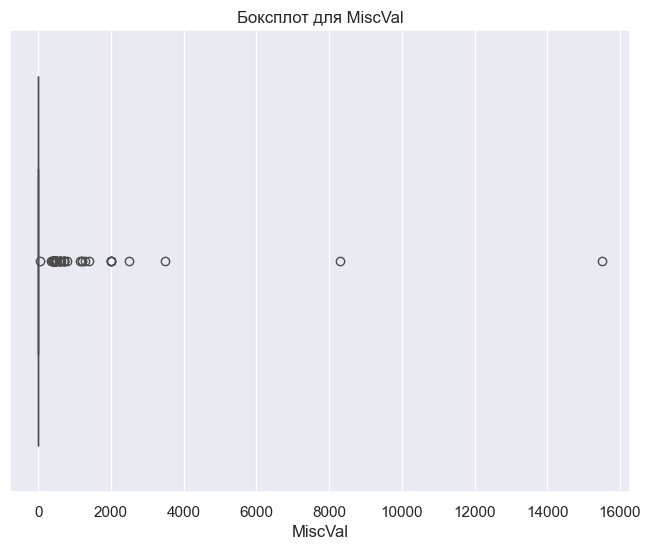

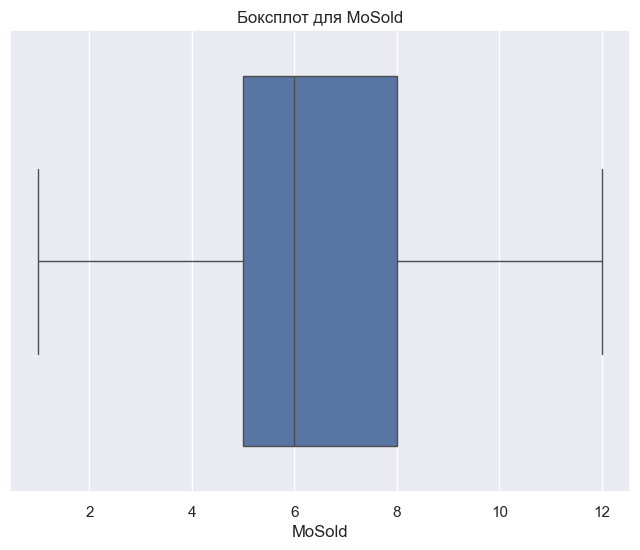

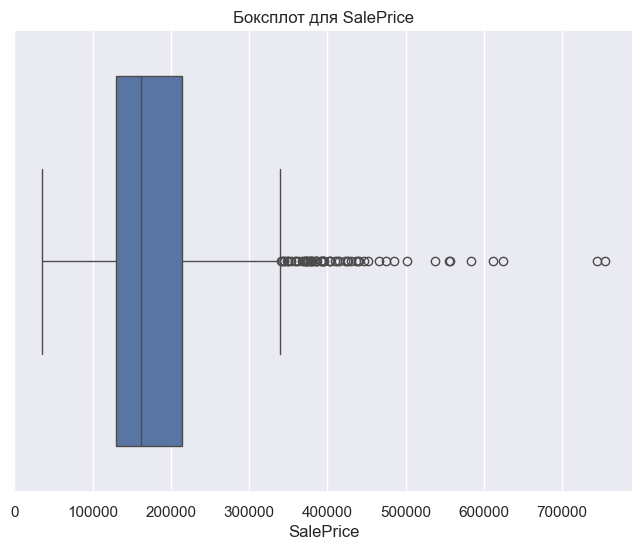

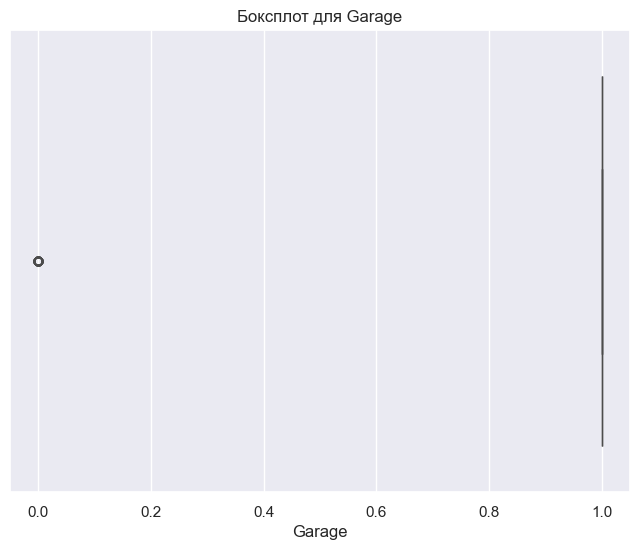

In [87]:
for i in df.select_dtypes(include = "number").columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[i])
    plt.title(f'Боксплот для {i}')
    plt.xlabel(i)
    plt.show()

Почти все переменные числовые содержат выбросы, обработаем самые важные из них: `LotFrontage`, `LotArea`, `MasVnrArea`, `TotalBsmtSF`, `1stFlrSF`, `2ndFlrSF`, `GrLivArea`. 

Все эти переменные содержат выбросы из-за того что в выборку попадают "ненормально большие дома" (асимметричные (скошенные) распределения). Эта как с доходами населения:

> Распределение доходов населения часто является скосным вправо из-за наличия небольшого числа людей с очень высоким доходом.

Используем метод `Усечение & Интерквартильный размах`

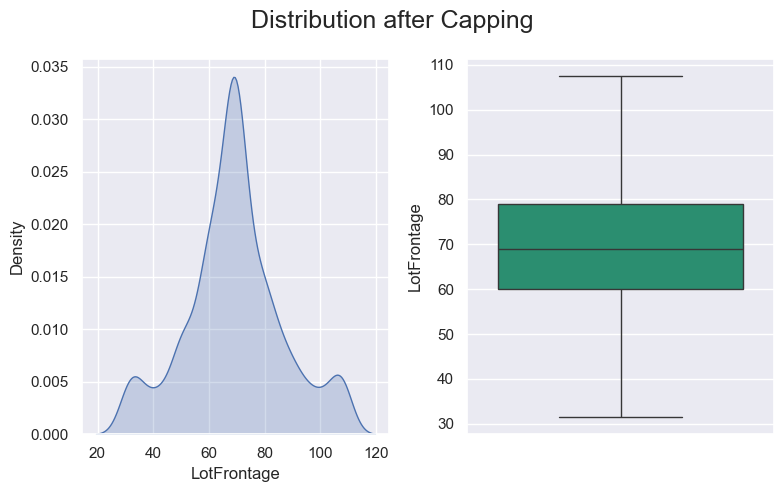

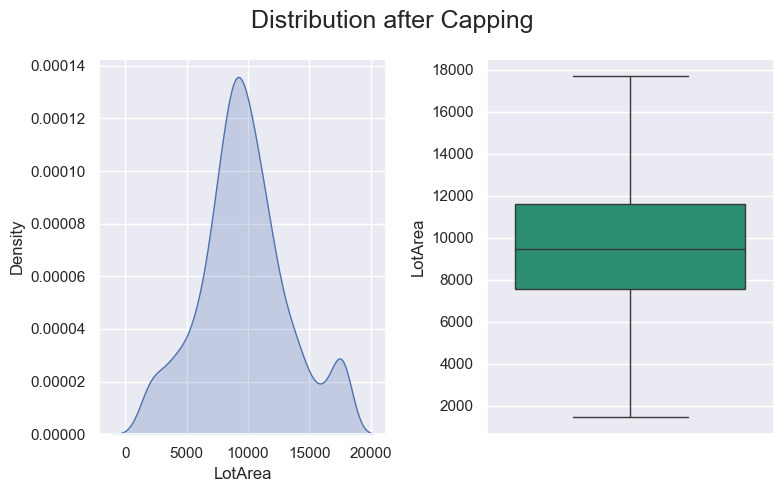

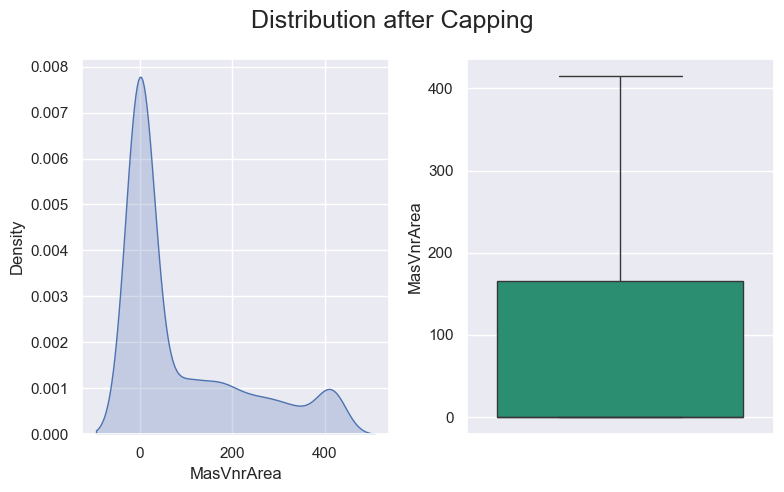

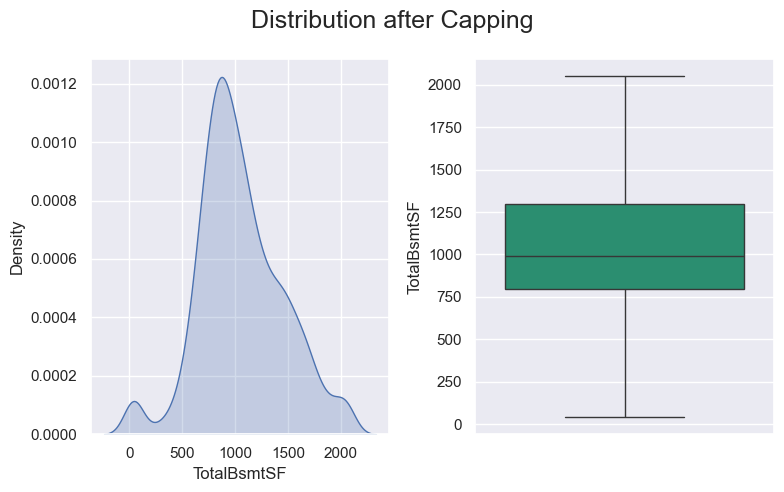

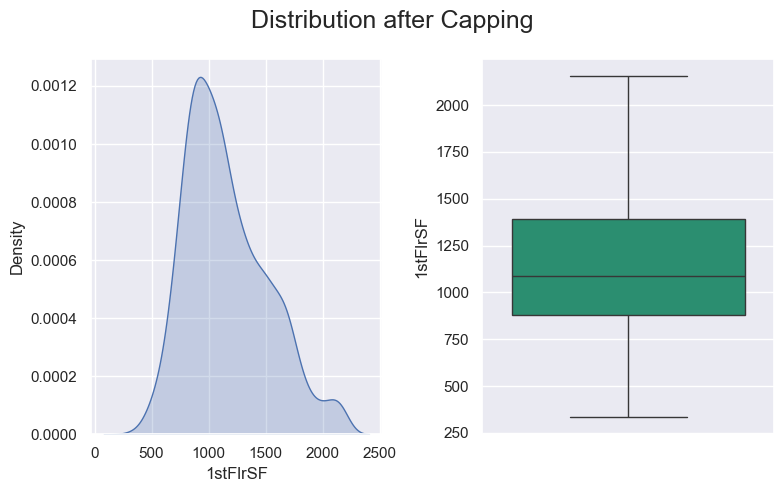

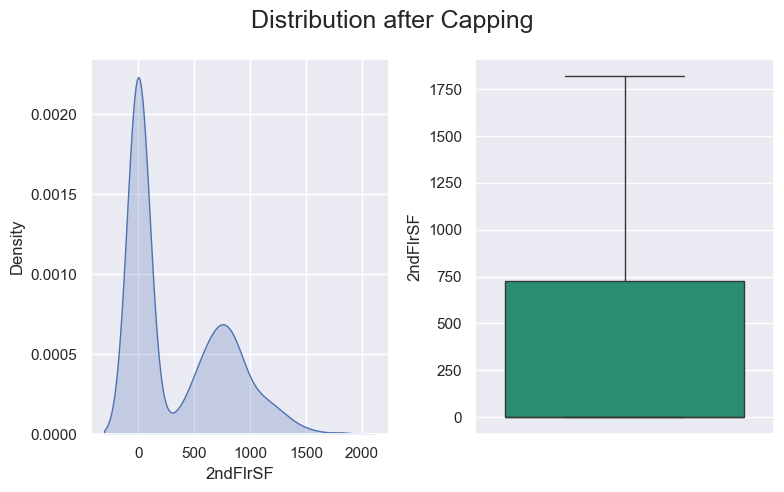

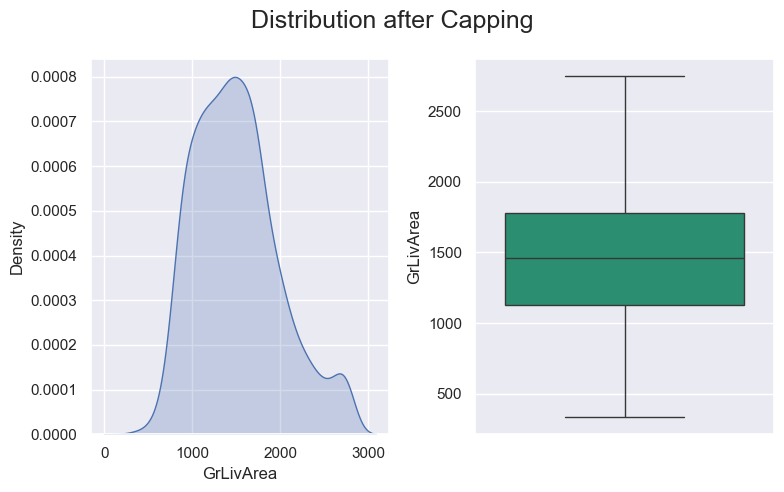

In [89]:
for i in ['LotFrontage', 'LotArea', 'MasVnrArea', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea']:
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    IQR = q3 - q1
    max_limit = q3 + (1.5 * IQR)
    min_limit = q1 - (1.5 * IQR)

    df[i] = np.where(df[i] > max_limit, max_limit, 
                     np.where(df[i] < min_limit, min_limit, df[i]))

    plt.figure(figsize=(8, 5))
    plt.suptitle("Distribution after Capping", fontsize=18)
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=df[i], fill=True, palette="cool")
    plt.subplot(1, 2, 2)
    sns.boxplot(data=df[i], palette="Dark2")
    plt.tight_layout()
    plt.show()

## Кодировка категориальных данных

In [91]:
for i in df.select_dtypes(include = "object").columns:
    print(f"{i}:{df[i].unique()}")

MSZoning:['RL' 'RM' 'C (all)' 'FV' 'RH']
Street:['Pave' 'Grvl']
Alley:['No alley access' 'Grvl' 'Pave']
LotShape:['Reg' 'IR1' 'IR2' 'IR3']
LandContour:['Lvl' 'Bnk' 'Low' 'HLS']
Utilities:['AllPub' 'NoSeWa']
LotConfig:['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope:['Gtl' 'Mod' 'Sev']
Neighborhood:['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1:['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2:['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType:['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle:['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle:['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl:['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTile']
Exterior1st:['Viny

Переменные с количеством уникальных значений 2 перекодируем в 0 и 1
Для остальных будем использовать `BinaryEncoder`, он не так сильно нагружает и даже снижает размерность данных в сравнении с `One-Hot Encoding`.

In [93]:
binary = [col for col in df.columns if df[col].nunique() == 2 and df[col].dtype == 'object']
for col in binary:
    df[col] = df[col].map({df[col].unique()[0]: 0, df[col].unique()[1]: 1})

binary = [col for col in df_test.columns if df_test[col].nunique() == 2 and df_test[col].dtype == 'object']
for col in binary:
    df_test[col] = df_test[col].map({df_test[col].unique()[0]: 0, df_test[col].unique()[1]: 1})

In [94]:
enc = ce.BinaryEncoder(cols=[col for col in df.columns if df[col].nunique() > 2 and df[col].dtype == 'object'])
df = enc.fit_transform(df)

enc = ce.BinaryEncoder(cols=[col for col in df_test.columns if df_test[col].nunique() > 2 and df_test[col].dtype == 'object'])
df_test = enc.fit_transform(df_test)

## Метрика

Мы могли бы использовать `MSE` — самую общеиспользуемую метрику, но наша целевая переменная выражена в цене, а величина среднеквадратичного отклонения плохо интерпретируется,
поскольку не сохраняет единицы измерения. Чтобы избежать этого, будем использовать корень из среднеквадратичной ошибки **`RMSE`**

# Построение модели

In [98]:
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

За базову модель возьмем `LinearRegression` — классическую линейная регрессию с оптимизацией MSE

Будем сравнивать ее с:
* `Ridge` — линейная регрессия с оптимизацией MSE и $\ell_2$-регуляризацией
* `Lasso` — линейная регрессия с оптимизацией MSE и $\ell_1$-регуляризацией

Удалим все столбцы с datetime, так как они плохо интерпритируемы и могут возникнуть ошибки

In [101]:
df = df.drop(columns=df.select_dtypes(include=['datetime']).columns)
df_test = df_test.drop(columns=df_test.select_dtypes(include=['datetime']).columns)

На предыдущем этапе Feature Engineering мы завершили всю необходимую предобработку данных: заполнили пропущенные значения, закодировали категориальные переменные, далее выполним масштабирование

Text(0.5, 1.0, 'target')

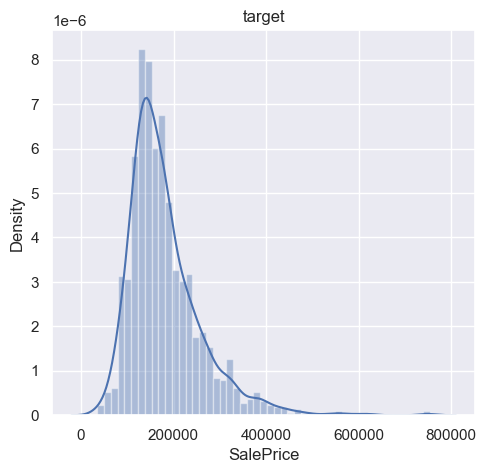

In [103]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.distplot(target, label='target')
plt.title('target')

Распределение несимметричное

Шум должен быть распределён нормально, поэтому лучше, когда целевая переменная распределена тоже нормально.
Если прологарифмировать целевую переменную, то её распределение станет больше похоже на нормальное:

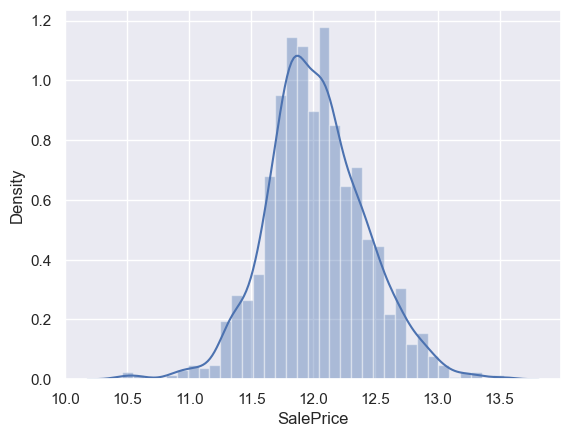

In [105]:
sns.distplot(np.log1p(target), label='target')
plt.show()

In [107]:
X = df.drop(columns=["SalePrice"])
y = df["SalePrice"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Применим стандартизацию, так как линейная регрессия чувствительна к масштабу признаков

In [109]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [110]:
linreg = LinearRegression()
linreg.fit(X_train_scaled, y_train)

LinearRegression()

In [111]:
y_pred_log_linreg = linreg.predict(X_test_scaled)
y_pred_linreg = np.expm1(y_pred_log_linreg)
rmse_linreg = mean_squared_error(np.expm1(y_test), y_pred_linreg, squared=False)
print(f"RMSE для LinReg: {rmse_linreg}")

RMSE для LinReg: 21563.137569403934


## Построим дополнительные модели `Ridge` и `Lasso`

In [113]:
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)
y_pred_log_ridge = ridge.predict(X_test_scaled)
y_pred_ridge = np.expm1(y_pred_log_ridge)
rmse_ridge = mean_squared_error(np.expm1(y_test), y_pred_ridge, squared=False)
print(f"RMSE для Ridge: {rmse_ridge}")

lasso = Lasso()
lasso.fit(X_train_scaled, y_train)
y_pred_log_lasso = lasso.predict(X_test_scaled)
y_pred_lasso = np.expm1(y_pred_log_lasso)
rmse_lasso = mean_squared_error(np.expm1(y_test), y_pred_lasso, squared=False)
print(f"RMSE для Lasso: {rmse_lasso}")

RMSE для Ridge: 21433.76420044774
RMSE для Lasso: 75932.36837278257


#### Linear Regression (RMSE: 21,563):

- базовая линейная регрессия показала хороший результат, данные подходят для линейной модели, но она может переобучаться из-за отсутствия регуляризации
#### Ridge Regression (RMSE: 21,433):

- модель с L2-регуляризацией (Ridge) показала немного лучший результат, чем базовая линейная регрессия. Регуляризация помогла справиться с излишне высокими коэффициентами, вызванными, вероятно, взаимосвязью признаков

#### Lasso Regression (RMSE: 75,932):

- модель с L1-регуляризацией (Lasso) сильно проиграла по результатам. Это может быть связано с тем, что Lasso "обнулило" слишком много признаков, потеряв важную информацию